In [312]:
import seaborn as sns
import os
import math
import copy
import random
import pickle
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import pandas as pd
import nltk
import time

from sklearn import svm
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from collections import defaultdict, Counter
from sklearn.metrics import balanced_accuracy_score, r2_score
from sklearn.metrics import multilabel_confusion_matrix, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.feature_selection import mutual_info_classif
nltk.download('punkt')


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/ravikiranm/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [313]:
df = pd.read_csv('Spotify_Youtube.csv')
print(df.head())
print(df.shape)

   Unnamed: 0    Artist                                        Url_spotify   
0           0  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...  \
1           1  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
2           2  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
3           3  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
4           4  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   

                                           Track   
0                                 Feel Good Inc.  \
1                                Rhinestone Eyes   
2  New Gold (feat. Tame Impala and Bootie Brown)   
3                             On Melancholy Hill   
4                                 Clint Eastwood   

                                           Album Album_type   
0                                     Demon Days      album  \
1                                  Plastic Beach      album   
2  New Gold (feat. Tame Impal

In [314]:
print(df.columns)
len(df.columns)

Index(['Unnamed: 0', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type',
       'Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Url_youtube', 'Title', 'Channel', 'Views', 'Likes',
       'Comments', 'Description', 'Licensed', 'official_video', 'Stream'],
      dtype='object')


28

In [315]:
df = df.drop(['Unnamed: 0', 'Url_spotify', 'Track', 'Uri', 'Duration_ms', 'Url_youtube', 
              'Title', 'Channel', 'Description', 'Licensed', 'official_video'], axis=1)
# print(df.columns)
# len(df.columns)

In [316]:
df.head()


,Artist,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Views,Likes,Comments,Stream
0,Gorillaz,Demon Days,album,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.772,138.559,693555221.0,6220896.0,169907.0,1.040235e+09
1,Gorillaz,Plastic Beach,album,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.852,92.761,72011645.0,1079128.0,31003.0,3.100837e+08
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.551,108.014,8435055.0,282142.0,7399.0,6.306347e+07
3,Gorillaz,Plastic Beach,album,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.578,120.423,211754952.0,1788577.0,55229.0,4.346636e+08
4,Gorillaz,Gorillaz,album,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.525,167.953,618480958.0,6197318.0,155930.0,6.172597e+08


In [317]:
missing_values_count_column_wise = df.isnull().sum()
print(missing_values_count_column_wise)

Artist                0
Album                 0
Album_type            0
Danceability          2
Energy                2
Key                   2
Loudness              2
Speechiness           2
Acousticness          2
Instrumentalness      2
Liveness              2
Valence               2
Tempo                 2
Views               470
Likes               541
Comments            569
Stream              576
dtype: int64


In [318]:
columns_to_fill = ['Views', 'Likes', 'Comments', 'Stream']
df[columns_to_fill] = df[columns_to_fill].fillna(df[columns_to_fill].mean())
missing_values_count_column_wise = df.isnull().sum()
print(missing_values_count_column_wise)

Artist              0
Album               0
Album_type          0
Danceability        2
Energy              2
Key                 2
Loudness            2
Speechiness         2
Acousticness        2
Instrumentalness    2
Liveness            2
Valence             2
Tempo               2
Views               0
Likes               0
Comments            0
Stream              0
dtype: int64


In [319]:
missing_values_count_row_wise = df.isnull().sum(axis=1)
num_rows_with_missing_values_row_wise = (missing_values_count_row_wise > 0).sum()
print(num_rows_with_missing_values_row_wise)

2


In [320]:
# As the number of rows with missing values is less compared to the total data we have, we can drop them
print(df.shape)
df.dropna(inplace=True)
print(df.shape)

(20718, 17)
(20716, 17)


In [321]:
# Changing the data type of the 'Key' column from float to int

df['Key'] = df['Key'].astype(int)

In [322]:
key_colors = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF', '#FF0000', '#00FF00']

Key
0     2305
7     2252
1     2211
2     2021
9     1979
5     1731
11    1667
4     1515
8     1483
6     1443
10    1439
3      670
Name: count, dtype: int64


<Axes: xlabel='Key'>

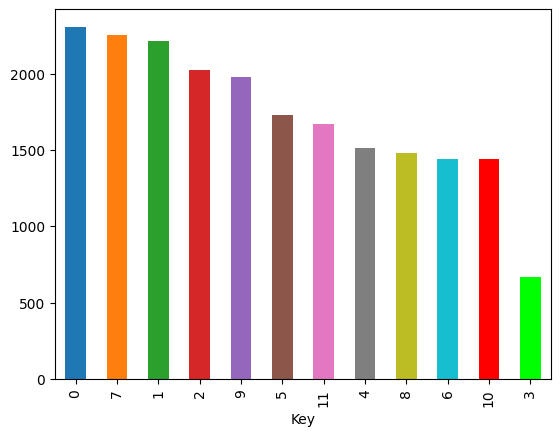

In [323]:
# check the class imbalance for key column
print(df['Key'].value_counts())
# bar graph 
df['Key'].value_counts().plot(kind='bar', color=key_colors)


In [324]:
df["Key"].value_counts()/len(df)

Key
0     0.111267
7     0.108708
1     0.106729
2     0.097557
9     0.095530
5     0.083559
11    0.080469
4     0.073132
8     0.071587
6     0.069656
10    0.069463
3     0.032342
Name: count, dtype: float64

In [325]:
df.dtypes

Artist               object
Album                object
Album_type           object
Danceability        float64
Energy              float64
Key                   int64
Loudness            float64
Speechiness         float64
Acousticness        float64
Instrumentalness    float64
Liveness            float64
Valence             float64
Tempo               float64
Views               float64
Likes               float64
Comments            float64
Stream              float64
dtype: object

In [326]:
unique_counts = df.nunique()
print(unique_counts)

Artist               2079
Album               11936
Album_type              3
Danceability          898
Energy               1268
Key                    12
Loudness             9417
Speechiness          1303
Acousticness         3138
Instrumentalness     4012
Liveness             1536
Valence              1293
Tempo               15024
Views               19245
Likes               17939
Comments            10485
Stream              18460
dtype: int64


Top 5 correlated features with the Key column are: 
Valence         0.042559
Danceability    0.037735
Energy          0.030160
Loudness        0.025266
Speechiness     0.019778
Name: Key, dtype: float64


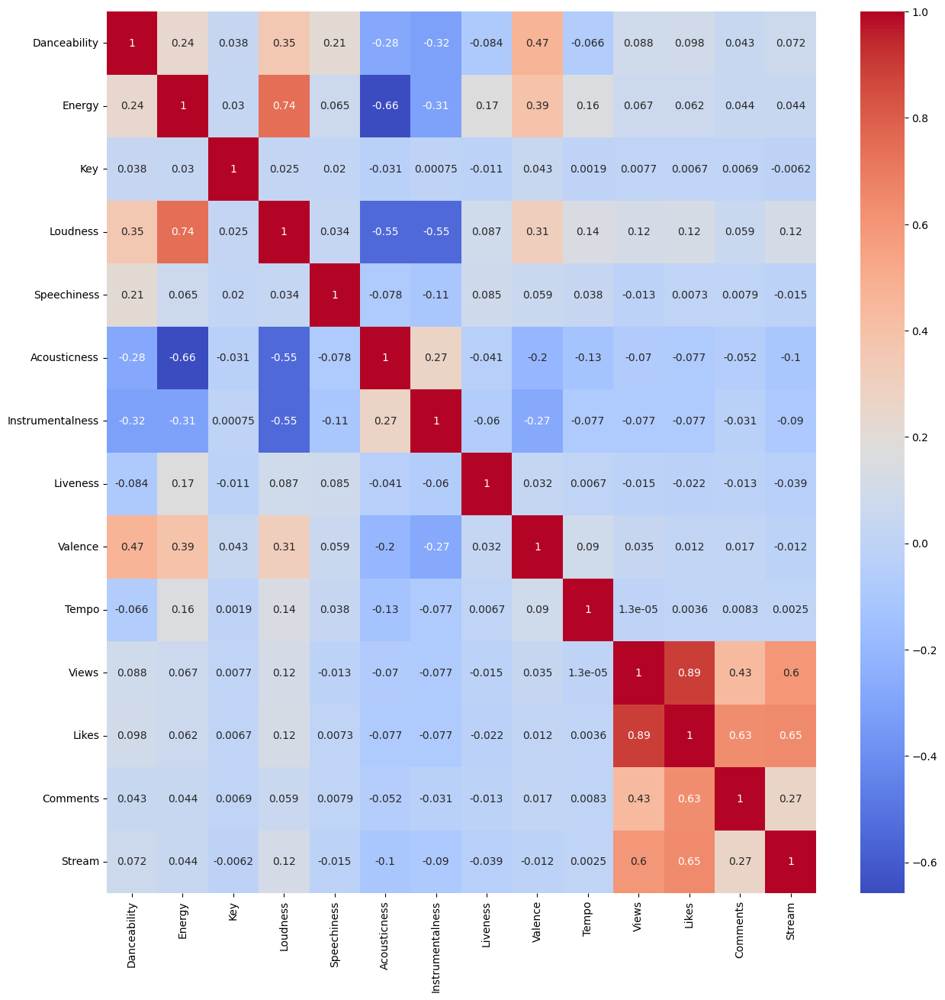

In [327]:
# draw the correlation for the numerical columns
numerical_columns = df.select_dtypes(include=['int32', 'int64', 'float64']).columns.tolist()
corr = df[numerical_columns].corr()
# plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm')

# get the top 5 correlated features with the Key column except the Key column itself
top_5_corr_features = corr['Key'].sort_values(ascending=False)[1:6]
print("Top 5 correlated features with the Key column are: ")
print(top_5_corr_features)

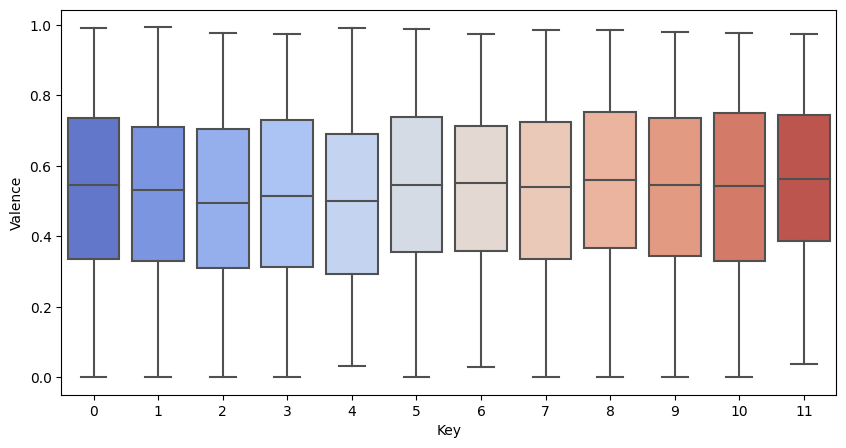

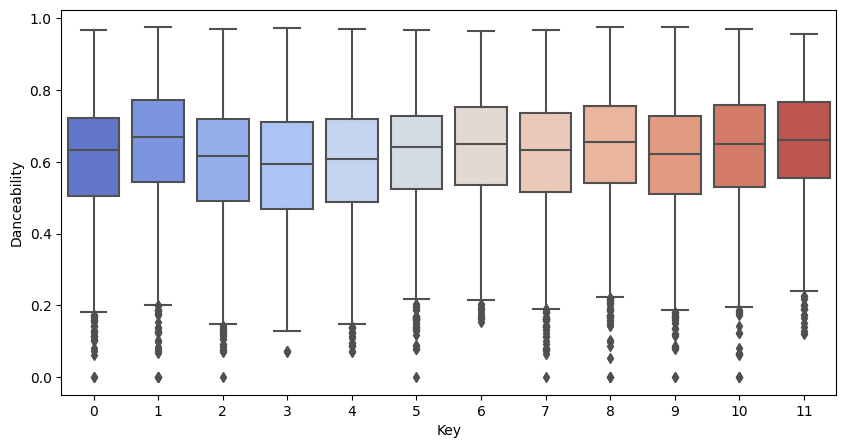

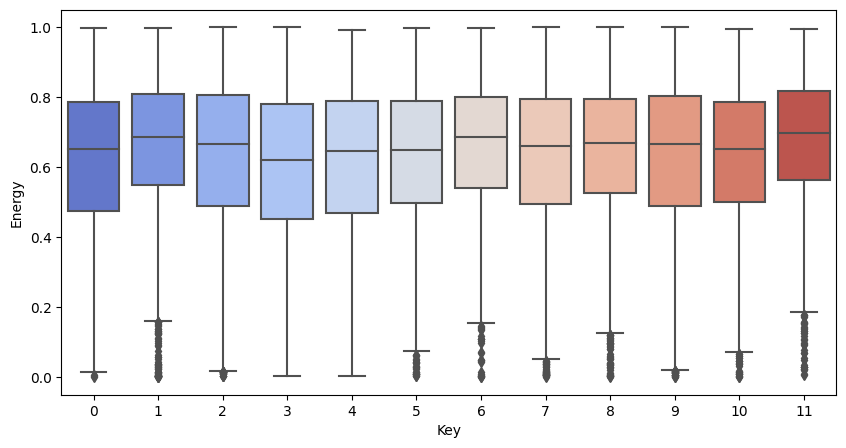

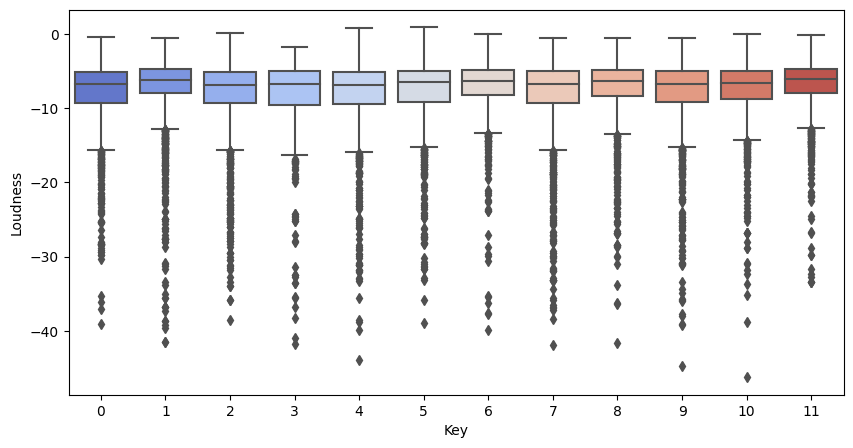

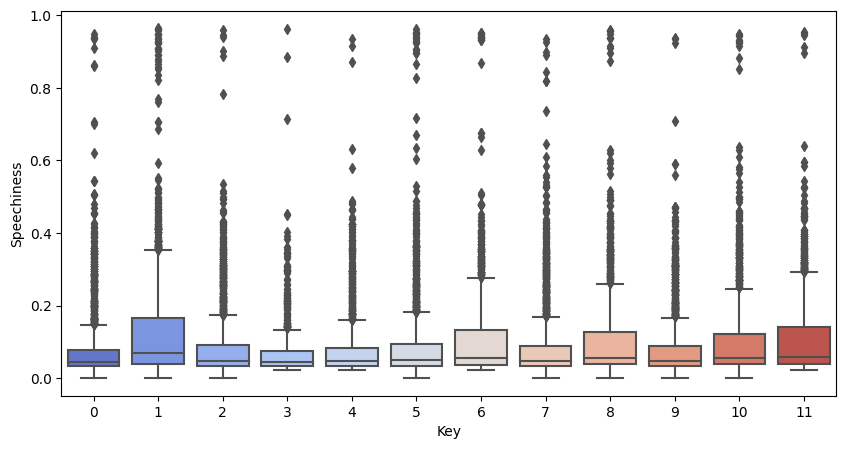

In [328]:
# get the top 5 correlated features with the Key column except the Key column itself
top_5_corr_features = corr['Key'].sort_values(ascending=False)[1:6]
# key vs top 5 correlated features
for feature in top_5_corr_features.index:
    # boxplot
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='Key', y=feature, data=df, palette='coolwarm')
    plt.show()

<!-- From the above plots, the observations are the valence is normally distributed with the key values. The Danceability& energy are in upper quartile. Loudness and Speechiness distribution is skewed with upper whisker and Lower Whisker respectively.  -->

array([[<Axes: title={'center': 'Danceability'}>,
        <Axes: title={'center': 'Energy'}>,
        <Axes: title={'center': 'Key'}>,
        <Axes: title={'center': 'Loudness'}>],
       [<Axes: title={'center': 'Speechiness'}>,
        <Axes: title={'center': 'Acousticness'}>,
        <Axes: title={'center': 'Instrumentalness'}>,
        <Axes: title={'center': 'Liveness'}>],
       [<Axes: title={'center': 'Valence'}>,
        <Axes: title={'center': 'Tempo'}>,
        <Axes: title={'center': 'Views'}>,
        <Axes: title={'center': 'Likes'}>],
       [<Axes: title={'center': 'Comments'}>,
        <Axes: title={'center': 'Stream'}>, <Axes: >, <Axes: >]],
      dtype=object)

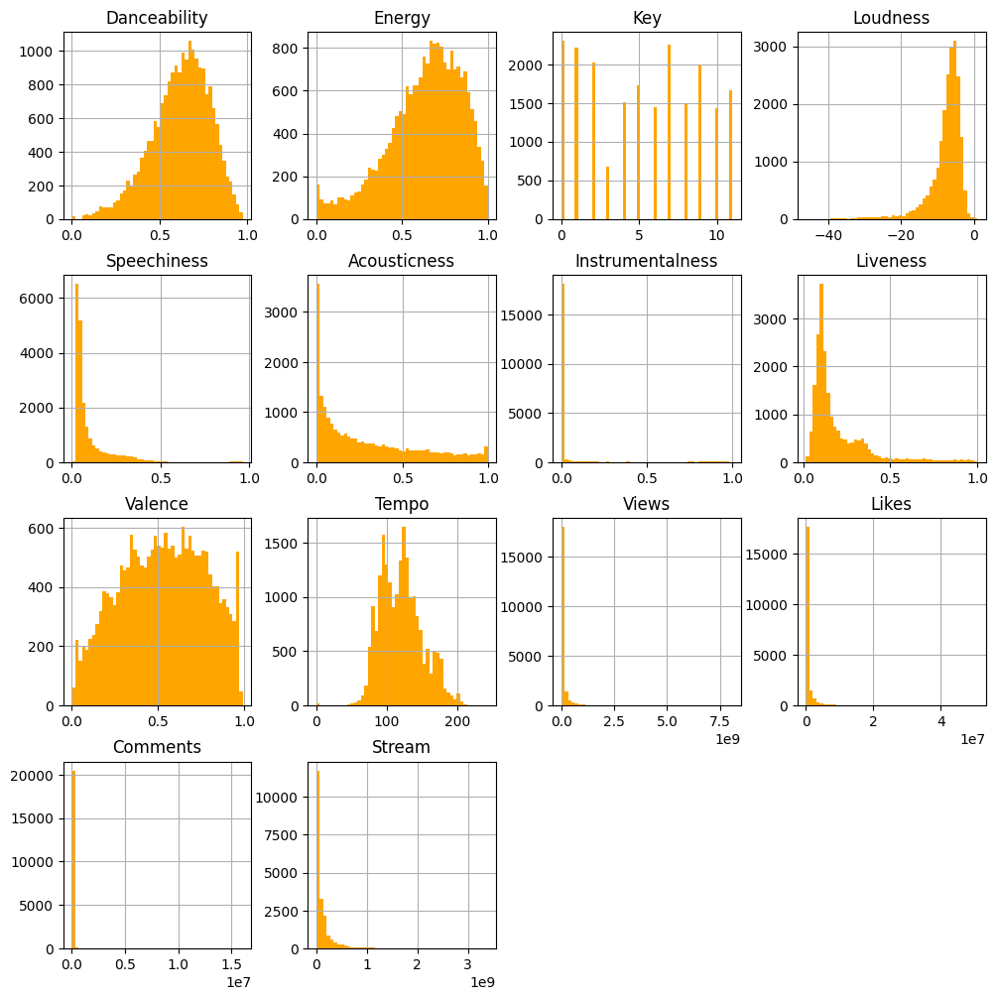

In [329]:
#Distribution of all numerical values
df_num_columns= df.select_dtypes(include=['int64', 'float64'])
df_num_columns.hist(figsize=(12,12), bins=50, xlabelsize=10, ylabelsize=10, color = 'orange')

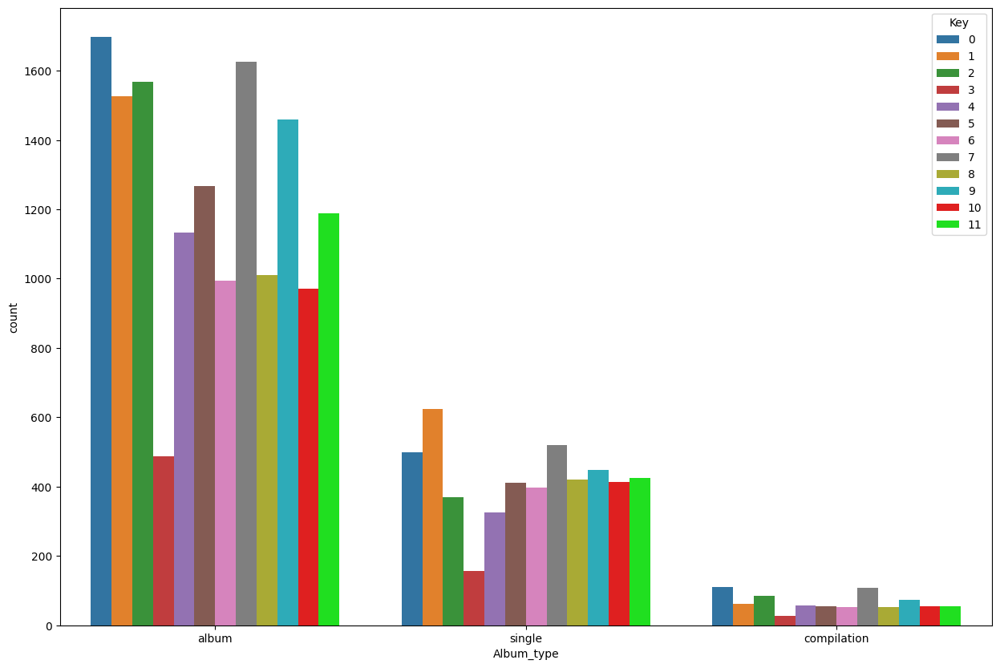

In [330]:
# plot the distribution of keys over album_type
plt.figure(figsize=(15, 10))
sns.countplot(x='Album_type', hue='Key', data=df, palette=key_colors)
plt.show()

In [331]:
top_artists = df.groupby(['Artist','Key']).agg({'Views': 'mean', 'Likes': 'mean', 'Comments': 'mean'}).reset_index()
# sort the values by Views in descending order
top_artists_views = top_artists.sort_values(by='Views', ascending=False).head(10)
# create a bar plot for the top 10 artists with the highest views
px.bar(top_artists_views, x='Artist', y='Views', title='Top 10 Artists & Keys with the highest views', color='Key').show()




# create a bar plot for the top 10 artists with the highest likes
top_artists_likes = top_artists.sort_values(by='Likes', ascending=False).head(10)
px.bar(top_artists_likes, x='Artist', y='Likes', title='Top 10 Artists & Keys with the highest likes', color='Key').show()


# create a bar plot for the top 10 artists with the highest comments
top_artists_comments = top_artists.sort_values(by='Comments', ascending=False).head(10)
px.bar(top_artists_comments, x='Artist', y='Comments', title='Top 10 Artists & Keys with the highest comments', color='Key').show()


In [332]:
# top albums
top_albums = df.groupby(['Album','Key']).agg({'Views': 'mean', 'Likes': 'mean', 'Comments': 'mean'}).reset_index()
# sort the values by Views in descending order
top_albums_views = top_albums.sort_values(by='Views', ascending=False).head(10)
# create a bar plot for the top 10 albums with the highest views
px.bar(top_albums_views, x='Album', y='Views', title='Top 10 Albums & Keys with the highest views', color='Key').show()

# create a bar plot for the top 10 albums with the highest likes
top_albums_likes = top_albums.sort_values(by='Likes', ascending=False).head(10)
px.bar(top_albums_likes, x='Album', y='Likes', title='Top 10 Albums & Keys with the highest likes', color='Key').show()

# create a bar plot for the top 10 albums with the highest comments
top_albums_comments = top_albums.sort_values(by='Comments', ascending=False).head(10)
px.bar(top_albums_comments, x='Album', y='Comments', title='Top 10 Albums & Keys with the highest comments', color='Key').show()

In [333]:
# views vs likes
fig = px.scatter(df, x='Views', y='Likes', title=f"{'Views'} vs {'Likes'}", color="Key", opacity=0.7)
fig.update_layout(xaxis_title='Views', yaxis_title='Likes', xaxis_type='log', yaxis_type='log')
fig.update_traces(marker=dict(size=8))
fig.show()
# views vs comments
fig = px.scatter(df, x='Views', y='Comments', title=f"{'Views'} vs {'Comments'}", color="Key", opacity=0.7)
fig.update_layout(xaxis_title='Views', yaxis_title='Comments', xaxis_type='log', yaxis_type='log')
fig.update_traces(marker=dict(size=8))
fig.show()
# likes vs comments
fig = px.scatter(df, x='Likes', y='Comments', title=f"{'Likes'} vs {'Comments'}", color="Key", opacity=0.7)
fig.update_layout(xaxis_title='Likes', yaxis_title='Comments', xaxis_type='log', yaxis_type='log')
fig.update_traces(marker=dict(size=8))
fig.show()

In [334]:
# The data is linear in case of view vs likes with the correlation of 0.89( refer the heatmap above). 
# Incase of view vs comments and likes vs comments the data is not linear with the correlation of 0.63 each (refer the heatmap above).

In [335]:
features = ['Views', 'Likes', 'Comments' ]
for feature in features:
    fig = px.violin(df, x='Key', y=feature, title=f'{feature} Distribution by Key', color='Key', box=True, points="all")
    fig.update_layout(xaxis_title='Key', yaxis_title=feature)
    # print all keys on x axis numbers
    fig.update_xaxes(tickmode='linear')
    fig.show()

In [336]:
df = df.drop(['Artist', 'Album'], axis=1)

In [337]:
# Let's convert all the columns to numerical values for further analysis
le = LabelEncoder()

# string_columns = ['Artist', 'Track', 'Album', 'Album_type', 'Licensed', 'official_video']
string_columns = ['Album_type']
for col in string_columns:
    df[col] = le.fit_transform(df[col])

df.head()


,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Views,Likes,Comments,Stream
0,0,0.818,0.705,6,-6.679,0.1770,0.008360,0.002330,0.6130,0.772,138.559,693555221.0,6220896.0,169907.0,1.040235e+09
1,0,0.676,0.703,8,-5.815,0.0302,0.086900,0.000687,0.0463,0.852,92.761,72011645.0,1079128.0,31003.0,3.100837e+08
2,2,0.695,0.923,1,-3.930,0.0522,0.042500,0.046900,0.1160,0.551,108.014,8435055.0,282142.0,7399.0,6.306347e+07
3,0,0.689,0.739,2,-5.810,0.0260,0.000015,0.509000,0.0640,0.578,120.423,211754952.0,1788577.0,55229.0,4.346636e+08
4,0,0.663,0.694,10,-8.627,0.1710,0.025300,0.000000,0.0698,0.525,167.953,618480958.0,6197318.0,155930.0,6.172597e+08


In [338]:
# Ignoring the columns which are not required for normalization.
normalize_columns = [
                    # 'Artist',
                    # 'Track',
                    # 'Album',
                    'Album_type',
                    'Danceability',
                    'Energy',
                    # 'Key',
                    'Loudness',
                    'Speechiness',
                    'Acousticness',
                    'Instrumentalness',
                    'Liveness',
                    'Valence',
                    'Tempo',
                    # 'Duration_ms',
                    'Views',
                    'Likes',
                    'Comments',
                    # 'Licensed',
                    # 'official_video',
                    'Stream'
                    ]


scaler = MinMaxScaler()
df[normalize_columns] = scaler.fit_transform(df[normalize_columns])
df.head()



,Album_type,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Views,Likes,Comments,Stream
0,0.0,0.838974,0.704994,6,0.838905,0.183610,0.008392,0.002330,0.607306,0.777442,0.569330,0.085840,0.122486,0.010564,0.307168
1,0.0,0.693333,0.702994,8,0.857222,0.031328,0.087248,0.000687,0.032268,0.858006,0.381149,0.008913,0.021247,0.001928,0.091562
2,1.0,0.712821,0.922998,1,0.897183,0.054149,0.042670,0.046900,0.102993,0.554884,0.443823,0.001044,0.005555,0.000460,0.018620
3,0.0,0.706667,0.738995,2,0.857328,0.026971,0.000014,0.509000,0.050228,0.582075,0.494810,0.026208,0.035216,0.003434,0.128349
4,0.0,0.680000,0.693994,10,0.797609,0.177386,0.025401,0.000000,0.056114,0.528701,0.690108,0.076548,0.122022,0.009695,0.182268


In [339]:
# use pearson correlation to find the correlation between features
corr_pearson = df.corr(method='pearson')
# print(corr_pearson)
corr_dict = {}
# find the most correlated features with key
for col in df.columns:
    if col != 'Key':
        corr = df['Key'].corr(df[col])
        # add it to the dictionary and sort it
        corr_dict[col] = corr

# sort the dictionary
sorted_corr = sorted(corr_dict.items(), key=lambda x: x[1], reverse=True)
print(sorted_corr)

[('Valence', 0.04255894080462939), ('Danceability', 0.03773503772189317), ('Energy', 0.03016044799719408), ('Album_type', 0.02627808491388522), ('Loudness', 0.02526578560976748), ('Speechiness', 0.019778162642965533), ('Views', 0.007682014567665631), ('Comments', 0.006947599623061719), ('Likes', 0.006666579266662927), ('Tempo', 0.0018549480935758564), ('Instrumentalness', 0.0007466754407707386), ('Stream', -0.0062003153121081385), ('Liveness', -0.011008075031597791), ('Acousticness', -0.030817516101292044)]


After the conversion to all numerical values, Top 5 correlated features with the Key column are: 
Valence         0.042559
Danceability    0.037735
Energy          0.030160
Album_type      0.026278
Loudness        0.025266
Name: Key, dtype: float64


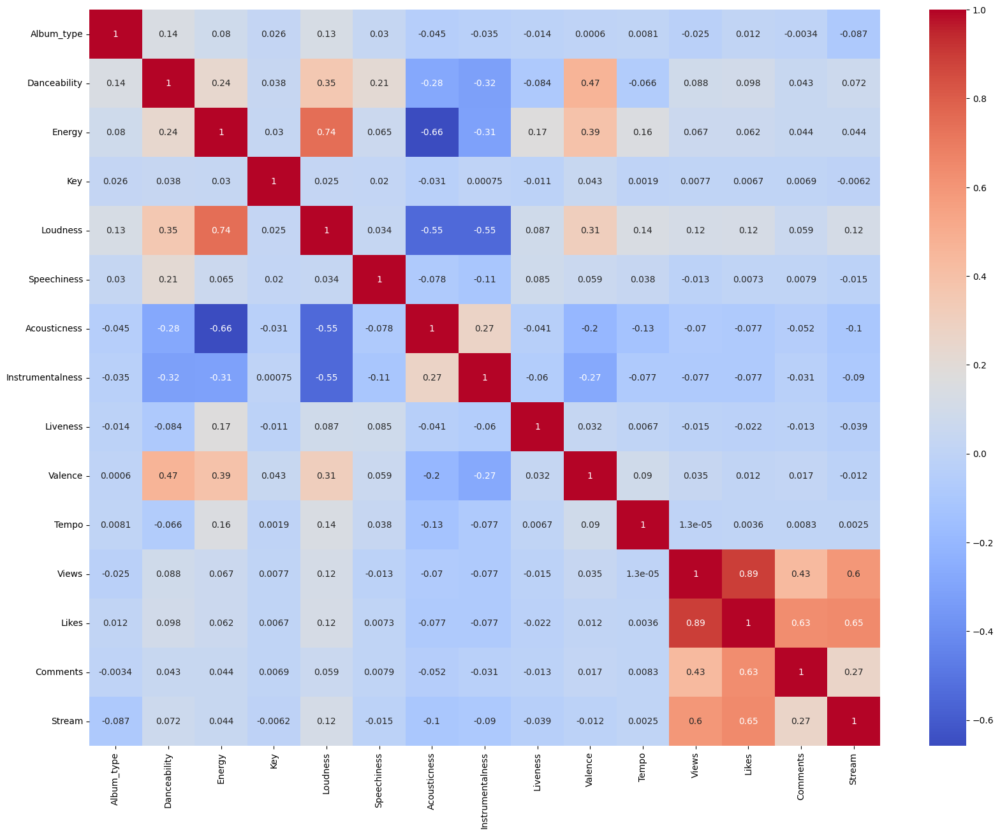

In [340]:
# Let's check the correlation between the features with the help of a heatmap.
corr = df.corr()
# plot the heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm')

# get the top 5 correlated features with the Key column except the Key column itself
top_5_corr_features = corr['Key'].sort_values(ascending=False)[1:6]
print("After the conversion to all numerical values, Top 5 correlated features with the Key column are: ")
print(top_5_corr_features)


In [341]:
# From the plot above, we can see that there is high negative correlation between Energy and Accousticness.(-0.66)
#  plot the scatter plot for Energy vs Accousticness
fig = px.scatter(df, x='Energy', y='Acousticness', title=f"{'Energy'} vs {'Acousticness'}", color="Key", opacity=0.7)
fig.update_layout(xaxis_title='Energy', yaxis_title='Acousticness', xaxis_type='log', yaxis_type='log')
fig.update_traces(marker=dict(size=8))
fig.show()

# Also with loudness and Accousticness.(-0.55) same with loudness and instrumentalness.(-0.55)
# plot the scatter plot for Loudness vs Accousticness
fig = px.scatter(df, x='Loudness', y='Acousticness', title=f"{'Loudness'} vs {'Acousticness'}", color="Key", opacity=0.7)
fig.update_layout(xaxis_title='Loudness', yaxis_title='Acousticness', xaxis_type='log', yaxis_type='log')
fig.update_traces(marker=dict(size=8))
fig.show()

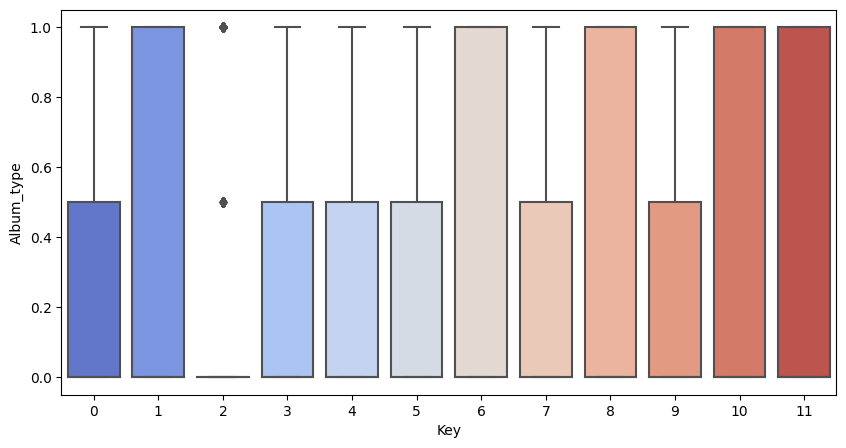

In [342]:
# After the conversion of string column's to all numerical values, the Album_type column is introduced into most correlated features with the Key column.
plt.figure(figsize=(10, 5))
sns.boxplot(x='Key', y='Album_type', data=df, palette='coolwarm')
plt.show()

<Axes: >

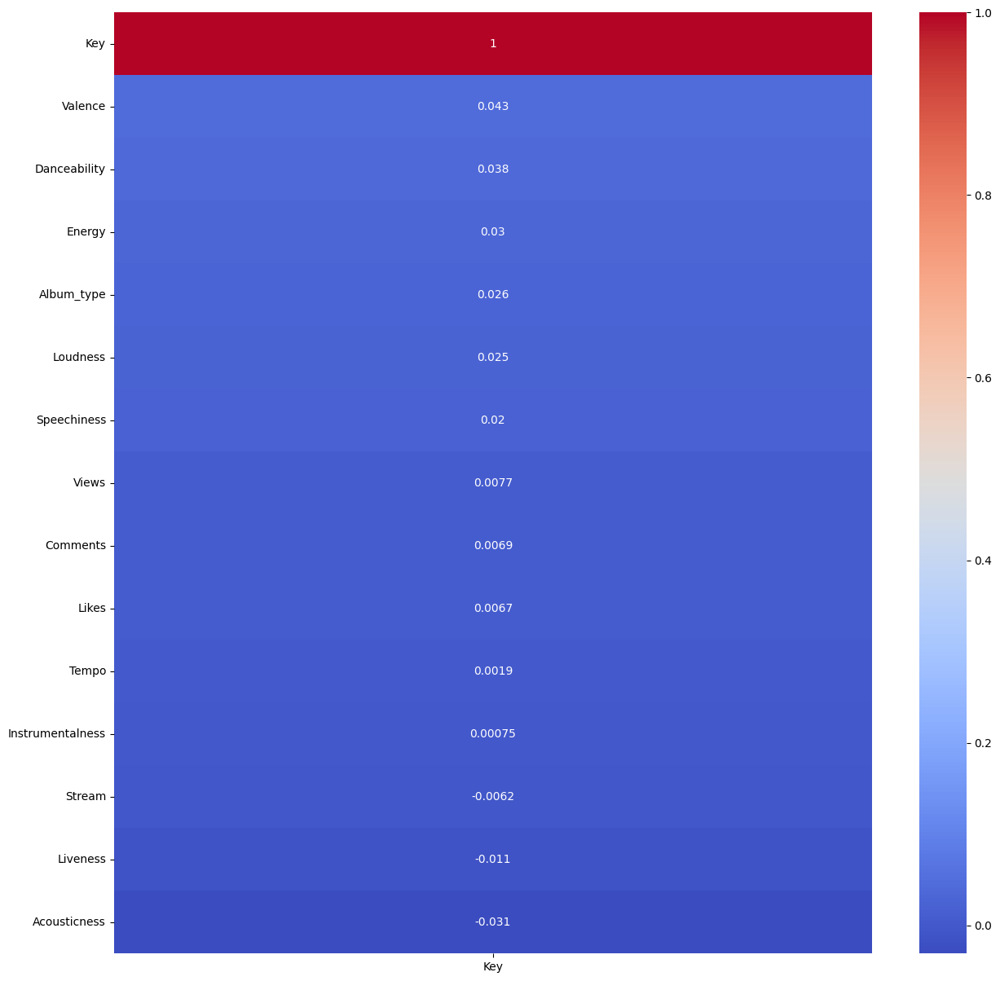

In [343]:
# draw the heatmap for only key column with all other columns
plt.figure(figsize=(15, 15))
sns.heatmap(df.corr()[['Key']].sort_values(by='Key', ascending=False), cmap='coolwarm', annot=True)


In [344]:
# Now let's do resampling to decrease the data set.
# We first get the best decision tree possible with the whole data set.

In [345]:
#------------------------Decision Tree Scikit learn for random sampling reference model. -----------------------
# Let us consider Decision Tree Classifier to get the best down sampling fraction.

In [346]:
df_copy = df.copy()
print(df_copy.shape)

# Create testing and training data sets

X_resampled = df_copy.drop('Key', axis=1).values
y_resampled = df_copy['Key'].values

# Let's split the data manually into training and testing data sets using 80:20 ratio.
# 80% of the data will be used for training and 20% of the data will be used for testing.

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, random_state=1, test_size=0.2)

(20716, 15)


Best Test Accuracy: 0.17270041997505922
Best Test Accuracy Depth: 20
Best F1 Micro: 0.17270041997505922
Best F1 Micro Depth: 20


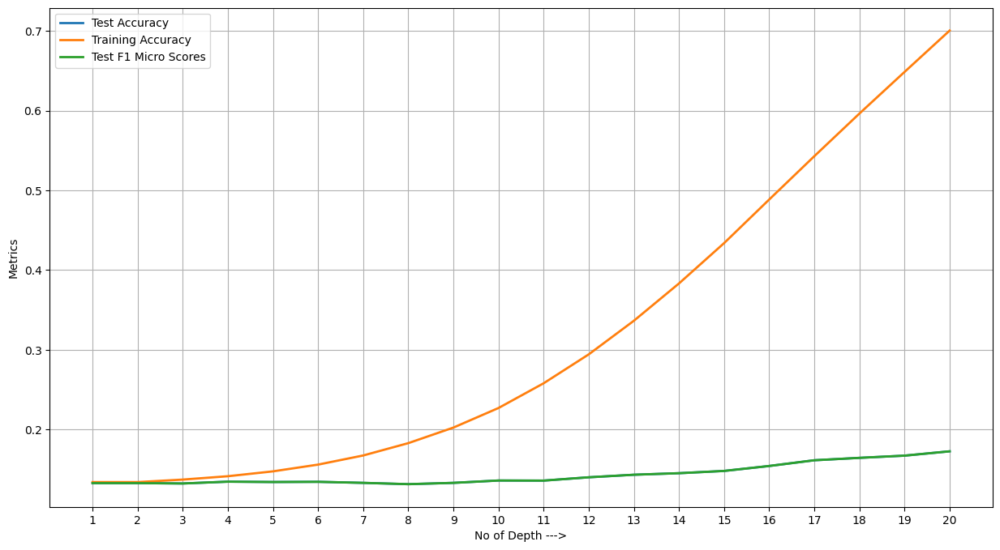

In [348]:

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_validate


#Dataset
X_train_dt = X_train
Y_train_dt = y_train
X_test_dt = X_test
Y_test_dt = y_test
training_accuracies= []
testing_accuracies =[]
testing_f1_micro_scores = []

best_test_accuracy = 0
best_f1_micro = 0

best_test_accuracy_depth = 0
best_f1_micro_depth = 0

max_depth = 20

# Create a decision tree classifier with variable depth

for d in range(1, max_depth+1):
    clf = DecisionTreeClassifier(max_depth=d)
    scores = cross_validate(clf, X_train_dt, Y_train_dt, cv=10, scoring=('accuracy', 'f1_micro'), return_train_score=True)
    training_accuracies.append(scores['train_accuracy'].mean())
    testing_accuracies.append(scores['test_accuracy'].mean())
    testing_f1_micro_scores.append(scores['test_f1_micro'].mean())
    
    if scores['test_accuracy'].mean() > best_test_accuracy:
        best_test_accuracy_depth = d
        best_test_accuracy = scores['test_accuracy'].mean()
        
    if scores['test_f1_micro'].mean() > best_f1_micro:
        best_f1_micro_depth = d
        best_f1_micro = scores['test_f1_micro'].mean()

print("Best Test Accuracy:", best_test_accuracy)
print("Best Test Accuracy Depth:", best_test_accuracy_depth)
print("Best F1 Micro:", best_f1_micro)
print("Best F1 Micro Depth:", best_f1_micro_depth)

# print("Training Accuracies:", training_accuracies)
# print("Testing Accuracies:", testing_accuracies)
# print("Testing F1 Micro Scores:", testing_f1_micro_scores)


x=list(range(1, max_depth+1))
plt.figure(figsize=(15,8))
plt.plot(testing_accuracies, label = "Test Accuracy", linestyle="-",linewidth=2)
plt.plot(training_accuracies, label = "Training Accuracy", linestyle="-",linewidth=2)
plt.plot(testing_f1_micro_scores, label = "Test F1 Micro Scores", linestyle="-",linewidth=2)
plt.xlabel('No of Depth --->')
plt.ylabel('Metrics')
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x)
plt.grid()
plt.legend()
plt.show()

In [349]:
# Now that our best depth is 20, we use it to decrease the training data set by 10% each time.
# We will do this 10 times and see how the accuracy changes.
# The point at which the accuracy starts to decrease will help us determine the optimal training data set size.

Best Test Accuracy: 0.17420971671885113
Best Test Accuracy Depth: 1.0
Best F1 Micro: 0.17420971671885113
Best F1 Micro Depth: 1.0
Training Accuracies: [0.704072015346361, 0.7312252361880063, 0.7490238140715204, 0.7734865900383141, 0.7810631130721513, 0.7745992299175684, 0.7588868578834125, 0.8086415315803539, 0.8841285729799514]
Testing Accuracies: [0.17420971671885113, 0.17056638310650318, 0.17084145820882782, 0.1592241379310345, 0.1551677906635795, 0.14783978135580378, 0.13503483661649646, 0.1399865053776474, 0.12311087249299313]
Testing F1 Micro Scores: [0.17420971671885113, 0.1705663831065032, 0.17084145820882782, 0.1592241379310345, 0.1551677906635795, 0.14783978135580378, 0.13503483661649646, 0.1399865053776474, 0.12311087249299313]


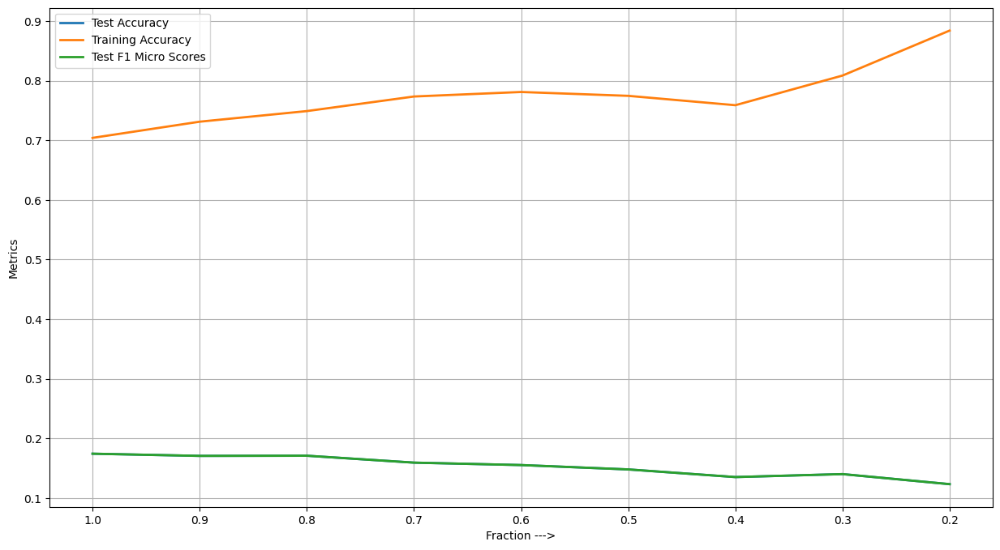

In [309]:
def get_down_sampled_data(df, frac=1):
    df_resampled = df.sample(frac=frac, axis='index', random_state=1, replace=False)
    X_resampled = df_resampled.drop('Key', axis=1).values
    y_resampled = df_resampled['Key'].values
    X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X_resampled, y_resampled, random_state=1, test_size=0.2)
    return X_train_r, y_train_r, X_test_r, y_test_r

training_accuracies= []
testing_accuracies =[]
testing_f1_micro_scores = []

best_test_accuracy = 0
best_f1_micro = 0

best_test_accuracy_frac = 0
best_f1_micro_frac = 0

total = 10

for frac in range(total, 1, -1):
    frac /= 10
    clf = DecisionTreeClassifier(max_depth=best_f1_micro_depth)
    X_train_cross_val, y_train_cross_val, _, _ = get_down_sampled_data(df, frac)
    scores = cross_validate(clf, X_train_cross_val, y_train_cross_val, cv=10, scoring=('accuracy', 'f1_micro'), return_train_score=True)
    training_accuracies.append(scores['train_accuracy'].mean())
    testing_accuracies.append(scores['test_accuracy'].mean())
    testing_f1_micro_scores.append(scores['test_f1_micro'].mean())

    if scores['test_accuracy'].mean() > best_test_accuracy:
        best_test_accuracy_frac = frac
        best_test_accuracy = scores['test_accuracy'].mean()

    if scores['test_f1_micro'].mean() > best_f1_micro:
        best_f1_micro_frac = frac
        best_f1_micro = scores['test_f1_micro'].mean()


print("Best Test Accuracy:", best_test_accuracy)
print("Best Test Accuracy Depth:", best_test_accuracy_frac)
print("Best F1 Micro:", best_f1_micro)
print("Best F1 Micro Depth:", best_f1_micro_frac)

print("Training Accuracies:", training_accuracies)
print("Testing Accuracies:", testing_accuracies)
print("Testing F1 Micro Scores:", testing_f1_micro_scores)


x=list([i/10 for i in range(total, 1, -1)])
plt.figure(figsize=(15,8))
plt.plot(testing_accuracies, label = "Test Accuracy", linestyle="-",linewidth=2)
plt.plot(training_accuracies, label = "Training Accuracy", linestyle="-",linewidth=2)
plt.plot(testing_f1_micro_scores, label = "Test F1 Micro Scores", linestyle="-",linewidth=2)
plt.xlabel('Fraction --->')
plt.ylabel('Metrics')
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x)
plt.grid()
plt.legend()
plt.show()

In [192]:
# Let's now see the data set for which the decrease in the accuracy is highest. 

In [295]:
for i, j in zip(testing_f1_micro_scores, testing_f1_micro_scores[1:]):
    print(f'{i} - {j} = {i-j}')
    

0.1752961264598847 - 0.1721751420048441 = 0.0031209844550406096
0.1721751420048441 - 0.16948359372776686 = 0.002691548277077238
0.16948359372776686 - 0.1610344827586207 = 0.008449110969146162
0.1610344827586207 - 0.15989423981072365 = 0.0011402429478970522
0.15989423981072365 - 0.14446032412020765 = 0.015433915690515998
0.14446032412020765 - 0.12990549229219925 = 0.014554831828008402
0.12990549229219925 - 0.13797645309608653 = -0.008070960803887278
0.13797645309608653 - 0.12492265133039711 = 0.013053801765689418


In [296]:
# There is a high drop in accuracy when the training data is 0.5 of the original data set.
# Let's update X_train, y_train, X_test, y_test to reflect this.
X_train, y_train, X_test, y_test = get_down_sampled_data(df, 0.5)

In [297]:
# Now that we have reduced the data set size with frac set as 0.5, let's see how the features are
# correlated with the target variable.

In [298]:
scores = mutual_info_classif(X_train, y_train, random_state=4)
columns = list(df.columns)
columns.remove('Key')

column_correlation_low_to_high = [(column, score) for column, score in zip(columns, scores)]

column_correlation_low_to_high.sort(key=lambda x: x[1], reverse=False)

column_correlation_low_to_high

[('Album_type', 0.00067619720958767),
 ('Instrumentalness', 0.026814914008948865),
 ('Comments', 0.03026699250435705),
 ('Danceability', 0.03393520837982589),
 ('Stream', 0.03706059439242715),
 ('Liveness', 0.04124225056836206),
 ('Tempo', 0.04223978954830976),
 ('Likes', 0.046088834979844506),
 ('Energy', 0.04706380049596115),
 ('Speechiness', 0.04929705985815591),
 ('Acousticness', 0.050087902507186755),
 ('Valence', 0.05176004411859658),
 ('Views', 0.05255204385824053),
 ('Loudness', 0.054408113648534595)]

In [299]:
# We can observe that all the features are very weakly correlated with the target variable.
# We will try to remove the features that are not correlated with the target variable and see if the accuracy improves.

Best Test Accuracy: 0.14880538219028805
Best Test Accuracy Depth: 0
Best F1 Micro: 0.14880538219028805
Best F1 Micro Depth: 0
Training Accuracies: [0.7690742702066622, 0.7644756171190916, 0.7722662312822891, 0.7656290127939382, 0.747217491125395, 0.741893958004259, 0.751414632414904, 0.7741443325751473, 0.7542983059071167, 0.6411766731387425, 0.619077177731931, 0.5504212603138481, 0.3780810606537102]
Testing Accuracies: [0.14301221423867883, 0.1438598101431793, 0.1422909273147905, 0.14530748296941196, 0.13842735849606358, 0.14216753203615323, 0.14361520486238583, 0.14880538219028805, 0.14313400698122994, 0.13818013088349274, 0.1321490591656323, 0.12768468499967947, 0.13118797456920914]
Testing F1 Micro Scores: [0.14301221423867883, 0.1438598101431793, 0.1422909273147905, 0.14530748296941196, 0.13842735849606358, 0.14216753203615323, 0.14361520486238583, 0.14880538219028805, 0.14313400698122994, 0.13818013088349274, 0.1321490591656323, 0.12768468499967947, 0.13118797456920914]


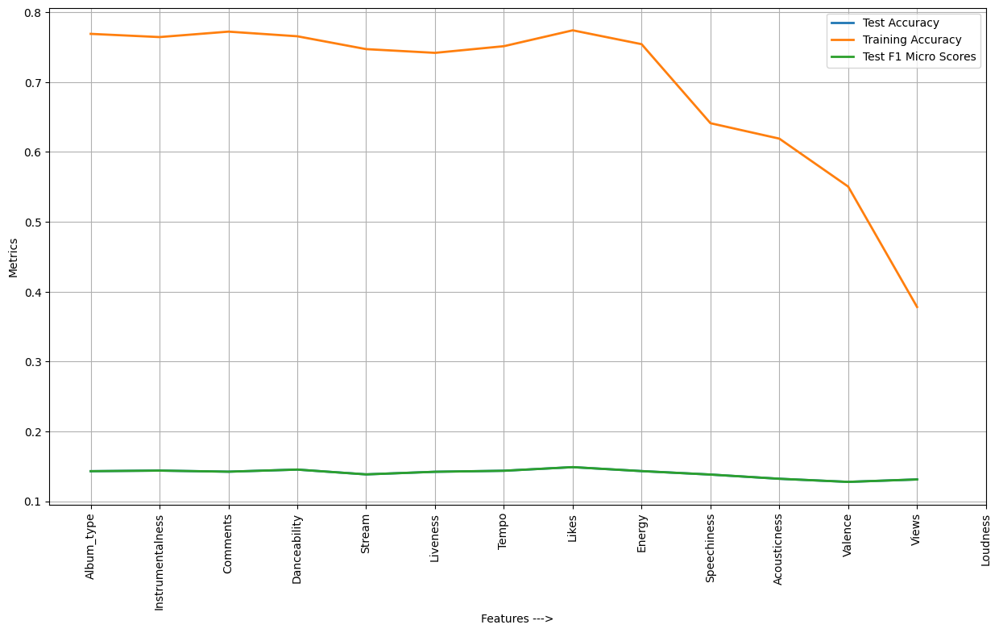

In [310]:
training_accuracies= []
testing_accuracies =[]
testing_f1_micro_scores = []

best_test_accuracy = 0
best_f1_micro = 0

best_test_accuracy_frac = 0
best_f1_micro_frac = 0

df_copy = df.copy()


for column_to_remove in column_correlation_low_to_high[:-1]:
    df_copy.drop(labels=[column_to_remove[0]], axis=1, inplace=True)
    X_train_col, y_train_col, X_test_col, y_test_col = get_down_sampled_data(df_copy, 0.5)
    clf = DecisionTreeClassifier(max_depth=best_f1_micro_depth)
    scores = cross_validate(clf, X_train_col, y_train_col, cv=10, scoring=('accuracy', 'f1_micro'), return_train_score=True)
    training_accuracies.append(scores['train_accuracy'].mean())
    testing_accuracies.append(scores['test_accuracy'].mean())
    testing_f1_micro_scores.append(scores['test_f1_micro'].mean())

    if scores['test_accuracy'].mean() > best_test_accuracy:
        best_test_accuracy_column_removal = column_to_remove
        best_test_accuracy = scores['test_accuracy'].mean()

    if scores['test_f1_micro'].mean() > best_f1_micro:
        best_f1_micro_column_removal = column_to_remove
        best_f1_micro = scores['test_f1_micro'].mean()


print("Best Test Accuracy:", best_test_accuracy)
print("Best Test Accuracy Depth:", best_test_accuracy_frac)
print("Best F1 Micro:", best_f1_micro)
print("Best F1 Micro Depth:", best_f1_micro_frac)

print("Training Accuracies:", training_accuracies)
print("Testing Accuracies:", testing_accuracies)
print("Testing F1 Micro Scores:", testing_f1_micro_scores)


x=list([c for c,v in column_correlation_low_to_high])
plt.figure(figsize=(15,8))
plt.plot(testing_accuracies, label = "Test Accuracy", linestyle="-",linewidth=2)
plt.plot(training_accuracies, label = "Training Accuracy", linestyle="-",linewidth=2)
plt.plot(testing_f1_micro_scores, label = "Test F1 Micro Scores", linestyle="-",linewidth=2)
plt.xlabel('Features --->')
plt.ylabel('Metrics')
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x, rotation=90)
plt.grid()
plt.legend()
plt.show()

In [202]:
# We can observe that removal of the lowest correlated feature till and including Liveness improves the accuracy of the model.


columns_to_remove = []
for label_column, corr in column_correlation_low_to_high:
    columns_to_remove.append(label_column)
    if label_column == 'Liveness':
        break

df.drop(labels=columns_to_remove, axis=1, inplace=True)
df.head()

,Energy,Key,Loudness,Speechiness,Acousticness,Valence,Tempo,Views,Likes
0,0.704994,6,0.838905,0.183610,0.008392,0.777442,0.569330,0.085840,0.122486
1,0.702994,8,0.857222,0.031328,0.087248,0.858006,0.381149,0.008913,0.021247
2,0.922998,1,0.897183,0.054149,0.042670,0.554884,0.443823,0.001044,0.005555
3,0.738995,2,0.857328,0.026971,0.000014,0.582075,0.494810,0.026208,0.035216
4,0.693994,10,0.797609,0.177386,0.025401,0.528701,0.690108,0.076548,0.122022


In [204]:
X = df.drop('Key', axis=1).values
y = df['Key'].values


# Let's split the data manually into training and testing data sets using 80:20 ratio.
# 80% of the data will be used for training and 20% of the data will be used for testing.
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, random_state=1, test_size=0.2)

X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=1, test_size=0.2)

In [203]:
#----------------------------- Decision Tree Own Implementation -----------------------------

In [350]:
# Decision Trees own Implementation for predicting the Key of a song.

def partition(x):
    """
    Partition the column vector x into subsets indexed by its unique values (v1, ... vk)

    Returns a dictionary of the form
    { v1: indices of x == v1,
      v2: indices of x == v2,
      ...
      vk: indices of x == vk }, where [v1, ... vk] are all the unique values in the vector z.
    """
    # x = np.array([])
    partitions_dict = {}
    unique_values = np.unique(x)
    for val in unique_values:
        indices_arr = np.where(x == val)[0]
        partitions_dict[val] = indices_arr
    return partitions_dict

def entropy(y):
    """
    Compute the entropy of a vector y by considering the counts of the unique values (v1, ... vk), in z

    Returns the entropy of z: H(z) = p(z=v1) log2(p(z=v1)) + ... + p(z=vk) log2(p(z=vk))
    """
    partition_dict = partition(y)
    total_count = len(y)
    ent = 0
    for val, indices in partition_dict.items():
        p = len(indices) / total_count
        ent += -p * math.log(p, 2)
    return ent

def mutual_information(x, y):
    """
    Compute the mutual information between a data column (x) and the labels (y). The data column is a single attribute
    over all the examples (n x 1). Mutual information is the difference between the entropy BEFORE the split set, and
    the weighted-average entropy of EACH possible split.

    Returns the mutual information: I(x, y) = H(y) - H(y | x)
    """
    # here x is not exactly what's present in the training data. It's modified such that it's true if x == 2 and false
    # other wise. So we are calculating the mutual information of each attribute value pair to get a binary decision
    # tree.
    gain = entropy(y)
    partition_dict = partition(x)
    total_count = len(x)
    for val, indices in partition_dict.items():
        p = len(indices) / total_count
        y_vals_for_indices = y[indices]
        gain -= p * entropy(y_vals_for_indices) # send a subset of y for each val
    return gain


def id3(x, y, attribute_value_pairs=None, depth=0, max_depth=5):
    """
    Implements the classical ID3 algorithm given training data (x), training labels (y) and an array of
    attribute-value pairs to consider. This is a recursive algorithm that depends on three termination conditions
        1. If the entire set of labels (y) is pure (all y = only 0 or only 1), then return that label
        2. If the set of attribute-value pairs is empty (there is nothing to split on), then return the most common
           value of y (majority label)
        3. If the max_depth is reached (pre-pruning bias), then return the most common value of y (majority label)
    Otherwise the algorithm selects the next best attribute-value pair using INFORMATION GAIN as the splitting criterion
    and partitions the data set based on the values of that attribute before the next recursive call to ID3.

    The tree we learn is a BINARY tree, which means that every node has only two branches. The splitting criterion has
    to be chosen from among all possible attribute-value pairs. That is, for a problem with two features/attributes x1
    (taking values a, b, c) and x2 (taking values d, e), the initial attribute value pair list is a list of all pairs of
    attributes with their corresponding values:
    [(x1, a),
     (x1, b),
     (x1, c),
     (x2, d),
     (x2, e)]
     If we select (x2, d) as the best attribute-value pair, then the new decision node becomes: [ (x2 == d)? ] and
     the attribute-value pair (x2, d) is removed from the list of attribute_value_pairs.

    The tree is stored as a nested dictionary, where each entry is of the form
                    (attribute_index, attribute_value, True/False): subtree
    * The (attribute_index, attribute_value) determines the splitting criterion of the current node. For example, (4, 2)
    indicates that we test if (x4 == 2) at the current node.
    * The subtree itself can be nested dictionary, or a single label (leaf node).
    * Leaf nodes are (majority) class labels

    Returns a decision tree represented as a nested dictionary, for example
    {(4, 1, False):
        {(0, 1, False):
            {(1, 1, False): 1,
             (1, 1, True): 0},
         (0, 1, True):
            {(1, 1, False): 0,
             (1, 1, True): 1}},
     (4, 1, True): 1}
    """
    # Termination conditions for the recursive function
    # 1. if the entire set is pure with just one label, return that label
    # 2. if there are no attribute value pairs to pick from, return the maximum of the remaining y's.
    # 3. If max_depth is reached, return the maximum of the remaining y's.


    if len(np.unique(y)) == 1:
        return y[0]
    elif attribute_value_pairs is not None and not attribute_value_pairs:
        return np.argmax(np.bincount(y))
    elif depth >= max_depth:
        return np.argmax(np.bincount(y))


    _, attributes_count = x.shape
    if attribute_value_pairs is None:
        attribute_value_pairs = set()
        for attr in range(1, attributes_count+1):
            attribute_column = x[:, attr-1]  # particular attribute column of all the examples
            partition_dict = partition(attribute_column)
            for attr_val in partition_dict.keys():
                attribute_value_pairs.add((attr, attr_val))
        attribute_value_pairs = list(attribute_value_pairs)

    best_pair = None
    best_pair_gain = - math.inf
    for pair in attribute_value_pairs:
        # Modify the attribute column in x according to the pair information
        attr, attr_val = pair
        attribute_column = x[:, attr-1]
        modified_attribute_column_for_pair = np.where(attribute_column == attr_val, 1, 0)
        gain = mutual_information(modified_attribute_column_for_pair, y)
        if gain > best_pair_gain:
            best_pair_gain = gain
            best_pair = pair

    attribute_value_pairs.remove(best_pair)
    attr, attr_val = best_pair

    true_examples_rows = np.where(x[:, attr-1] == attr_val)
    false_examples_rows = np.where(x[:, attr - 1] != attr_val)

    # We are sending the false examples to the left child and true ones to the right child.
    x_left = x[false_examples_rows, :][0]
    y_left = y[false_examples_rows]

    x_right = x[true_examples_rows, :][0]
    y_right = y[true_examples_rows]

    left_child_result = id3(x_left, y_left, copy.deepcopy(attribute_value_pairs), depth=depth+1, max_depth=max_depth)
    right_child_result = id3(x_right, y_right, copy.deepcopy(attribute_value_pairs), depth=depth+1, max_depth=max_depth)

    return {(attr, attr_val, False): left_child_result, (attr, attr_val, True): right_child_result}

# Get the best depth using validation set
# Save all the models in your local directory in a dictionary
# With the best depth, train the model on the entire training set and test on the test set.

In [351]:
def predict_example(x, tree):
    """
    Predicts the classification label for a single example x using tree by recursively descending the tree until
    a label/leaf node is reached.

    Returns the predicted label of x according to tree
    """

    # reference https://stackoverflow.com/a/40430011
    if isinstance(tree, (int, np.integer)):
        return tree
    k = list(tree.keys())
    assert len(k) == 2
    attr, attr_val, _ = k[0]
    if x[attr-1] == attr_val:
        return predict_example(x, tree[(attr, attr_val, True)])
    else:
        return predict_example(x, tree[(attr, attr_val, False)])

def compute_error(y_true, y_pred):
    """
    Computes the average error between the true labels (y_true) and the predicted labels (y_pred)

    Returns the error = (1/n) * sum(y_true != y_pred)
    """
    n = len(y_true)
    return (1/n) * np.sum(y_pred != y_true)


In [702]:
best_depth = None
best_weighted_depth = None
best_validation_accuracy = -math.inf
best_validation_weighted_accuracy = -math.inf
best_confusion_matrix = None
best_weighted_confusion_matrix = None
training_accuracies = []
validation_accuracies = []
test_accuracies = []
training_p_scores = []
training_r_scores = []
validation_p_scores = []
validation_r_scores = []
testing_p_scores = []
testing_r_scores = []
training_weighted_accuracies = []
validation_weighted_accuracies = []
test_weighted_accuracies = []

def predict_and_get_accuracies(decision_tree, X, y):
    y_pred = [predict_example(x, decision_tree) for x in X]
    accuracy = 1 - compute_error(y_true=y, y_pred=y_pred)
    weighted_accuracy = balanced_accuracy_score(y_true=y, y_pred=y_pred, adjusted=True)
    confusion_matrix = multilabel_confusion_matrix(y_pred=y_pred, y_true=y, labels=np.unique(y))
    p_score = precision_score(y_true=y, y_pred=y_pred, average='micro')
    r_score = recall_score(y_true=y, y_pred=y_pred, average='micro')
    f_score = f1_score(y_true=y, y_pred=y_pred, average='micro')
    return accuracy, weighted_accuracy, confusion_matrix, p_score, r_score, f_score

retrain = False

for depth in range(1,21):
    decision_tree = None
    if os.path.isfile(f'./decision_trees/decision_tree_{depth}.pkl') and not retrain:
        decision_tree = pickle.load(open(f'./decision_trees/decision_tree_{depth}.pkl', 'rb'))
    else:
        decision_tree = id3(X_train, y_train, max_depth=depth)
        pickle.dump(decision_tree, open(f'./decision_trees/decision_tree_{depth}.pkl', 'wb'))

    tr_acc, tr_wt_acc, tr_cm, _, _, _ = predict_and_get_accuracies(decision_tree, X_train, y_train)
    training_accuracies.append(tr_acc)
    training_weighted_accuracies.append(tr_wt_acc)

    val_acc, val_wt_acc, val_cm, _, _, _ = predict_and_get_accuracies(decision_tree, X_val, y_val)
    validation_accuracies.append(val_acc)
    validation_weighted_accuracies.append(val_wt_acc)

    tst_acc, tst_wt_acc, tst_cm, _, _, _ = predict_and_get_accuracies(decision_tree, X_test, y_test)
    test_accuracies.append(tst_acc)
    test_weighted_accuracies.append(tst_wt_acc)
    
    if val_acc > best_validation_accuracy:
        best_validation_accuracy = val_acc
        best_depth = depth
        best_decision_tree = decision_tree
        best_confusion_matrix = val_cm
    
    if val_wt_acc > best_validation_weighted_accuracy:
        best_validation_weighted_accuracy = val_wt_acc
        best_weighted_depth = depth
        best_weighted_decision_tree = decision_tree
        best_weighted_confusion_matrix = val_cm

print(f'Best depth: {best_depth}')
print(f'Best validation accuracy: {best_validation_accuracy:.4f}')

print(f'Best weighted depth: {best_weighted_depth}')
print(f'Best weighted validation accuracy: {best_validation_weighted_accuracy:.4f}')

print(f'Training accuracies: {training_accuracies}')
print(f'Validation accuracies: {validation_accuracies}')
print(f'Test accuracies: {test_accuracies}')
print(f'best_confusion_matrix: {best_confusion_matrix}')

print(f'Training weighted accuracies: {training_weighted_accuracies}')
print(f'Validation weighted accuracies: {validation_weighted_accuracies}')
print(f'Test weighted accuracies: {test_weighted_accuracies}')
print(f'best_confusion_weighted_matrix: {best_weighted_confusion_matrix}')


/opt/homebrew/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/homebrew/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/homebrew/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/homebrew/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt

Best depth: 2
Best validation accuracy: 0.1264
Best weighted depth: 18
Best weighted validation accuracy: 0.0158
Training accuracies: [0.11571245379799355, 0.11774911367579399, 0.12106811495813541, 0.12265218375198017, 0.12476427547710645, 0.1264992079656031, 0.12876216338538138, 0.13132684619446333, 0.13396696085087123, 0.1362299162706495, 0.13909632646903525, 0.14135928188881353, 0.14324507807196196, 0.14603605642302186, 0.14867617107942976, 0.15124085388851172, 0.15373010485026783, 0.15621935581202384, 0.15870860677377996, 0.16187674436146948]
Validation accuracies: [0.12549019607843137, 0.12639517345399698, 0.119155354449472, 0.119155354449472, 0.11945701357466054, 0.119155354449472, 0.11885369532428347, 0.11975867269984919, 0.12036199095022626, 0.1206636500754148, 0.12096530920060333, 0.12217194570135748, 0.12217194570135748, 0.12307692307692308, 0.12277526395173455, 0.12277526395173455, 0.12307692307692308, 0.12337858220211162, 0.12337858220211162, 0.12337858220211162]
Test accur

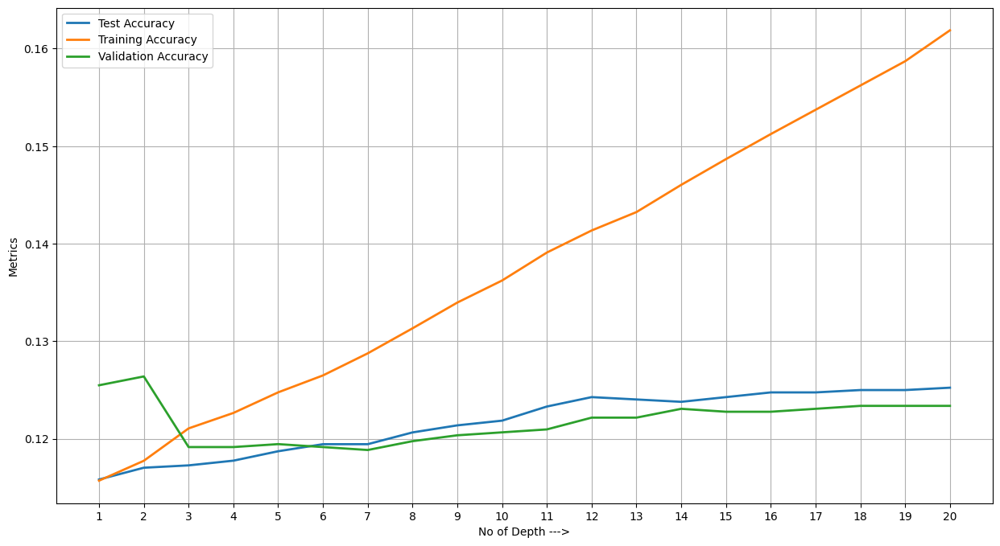

In [703]:
x=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]

plt.figure(figsize=(15,8))
plt.plot(test_accuracies, label = "Test Accuracy", linestyle="-",linewidth=2)
plt.plot(training_accuracies, label = "Training Accuracy", linestyle="-",linewidth=2)
plt.plot(validation_accuracies, label = "Validation Accuracy", linestyle="-",linewidth=2)
plt.xlabel('No of Depth --->')
plt.ylabel('Metrics')
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x)
plt.grid()
plt.legend()
plt.show()

In [205]:
# We can observe that the training accuracy as well as the validation and testing accuracy is increasing with the increase in depth of the tree.
# This is because the model is getting more complex and is able to fit the data better.
# Let us now try to explore other own implementations to conclude if this trend still holds true.

# Let's retrain the decision tree on the entire training set with the best depth and get the training accuracy, test accuracy, precision, recall and the f1 score.

# As we can see that the validation accuracy is large for very less depth, this could be a mere coincidence. Hence we will consider the best depth to be
# the one which gives the best weighted accuracy on the validation set.

In [353]:
df.shape

(20716, 15)

In [355]:
retrain = False

def predict_and_get_accuracies(decision_tree, X, y):
    y_pred = [predict_example(x, decision_tree) for x in X]
    accuracy = 1 - compute_error(y_true=y, y_pred=y_pred)
    weighted_accuracy = balanced_accuracy_score(y_true=y, y_pred=y_pred, adjusted=True)
    confusion_matrix = multilabel_confusion_matrix(y_pred=y_pred, y_true=y, labels=np.unique(y))
    p_score = precision_score(y_true=y, y_pred=y_pred, average='micro')
    r_score = recall_score(y_true=y, y_pred=y_pred, average='micro')
    f_score = f1_score(y_true=y, y_pred=y_pred, average='micro')
    return accuracy, weighted_accuracy, confusion_matrix, p_score, r_score, f_score

X_train_bdt, y_train_bdt, X_test_bdt, y_test_bdt = get_down_sampled_data(df, 0.5)

file_name = f'./decision_trees/decision_tree_{18}_best.pkl'

if os.path.isfile(file_name) and not retrain:
    best_depth_decision_tree = pickle.load(open(file_name, 'rb'))
else:
    best_depth_decision_tree = id3(X_train, y_train, max_depth=18)
    pickle.dump(best_depth_decision_tree, open(file_name, 'wb'))

tr_acc, tr_wt_acc, tr_cm, tr_p, tr_r, tr_f = predict_and_get_accuracies(best_depth_decision_tree, X_train_bdt, y_train_bdt)
tst_acc, tst_wt_acc, tst_cm, tst_p, tst_r, tst_f = predict_and_get_accuracies(best_depth_decision_tree, X_test_bdt, y_test_bdt)

print(f'training accuracy = {tr_acc:.4f}')
print(f'training weighted accuracy = {tr_wt_acc:.4f}')
print(f'training precision = {tr_p:.4f}')
print(f'training recall = {tr_r:.4f}')
print(f'training f1 score = {tr_f:.4f}')

print(f'test accuracy = {tst_acc:.4f}')
print(f'test weighted accuracy = {tst_wt_acc:.4f}')
print(f'test precision = {tst_p:.4f}')
print(f'test recall = {tst_r:.4f}')
print(f'test f1 score = {tst_f:.4f}')

training accuracy = 0.1457
training weighted accuracy = 0.0398
training precision = 0.1457
training recall = 0.1457
training f1 score = 0.1457
test accuracy = 0.1318
test weighted accuracy = 0.0352
test precision = 0.1318
test recall = 0.1318
test f1 score = 0.1318


In [107]:
#------------------------- Gaussian Naive Bayes (Own Implementation) ----------------------------

In [357]:
X_train_nb, X_test_nb, Y_train_nb, Y_test_nb = train_test_split(df.drop('Key', axis=1), y, random_state=1, test_size=0.2)

In [358]:
class GNaiveBayes():
    def partition(self, x):
        """
        Partition the column vector x into subsets indexed by its unique values (v1, ... vk)

        Returns a dictionary of the form
        { v1: indices of x == v1,
        v2: indices of x == v2,
        ...
        vk: indices of x == vk }, where [v1, ... vk] are all the unique values in the vector z.
        """

        # INSERT YOUR CODE HERE
        # Get unique values and their indices
        unique_values = np.unique(x)
        partitions = {val: [] for val in unique_values}
        for i,val in enumerate(x):
            partitions[val].append(i)
        return partitions

    def fit(self, X, Y):
        label_counts = {}
        for index, c in enumerate(Y):
            if c in label_counts:
                label_counts[c] += 1
            else:
                label_counts[c] = 1
        self.classes = label_counts.keys()
        count = X.shape[0]
        prior_y = []
        for c in self.classes:
            prior_y.append(label_counts[c]/count)
        self.prior_y = prior_y

        column_names = X.columns.values
        feature_columns = column_names.copy()
        y_partitions = self.partition(Y)
        # initialize 2-d array for mean values
        mean_values = [ [] for i in range(len(self.classes))]
        
        # for each feature column, find the mean for each class
        for index, c in enumerate(self.classes):
            c = int(c)
            for col in feature_columns:
                mean_values[index].append(round(X.iloc[y_partitions[c]][col].mean(), 8))
        self.mean_values = np.array(mean_values)
        
        variance_values = [[] for i in range(len(self.classes))]
        for index, c in enumerate(self.classes):
            c = int(c)
            for col in feature_columns:
                variance_values[index].append(round(X.iloc[y_partitions[c]][col].var(), 8))
        self.variance_values = np.array(variance_values)
                

    def predict(self, X):
        # avoid overflow by using log
        cond_prob = []
        for index, c in enumerate(self.classes):
            gauss_prob = np.log(self.gaussian_probability(X,index))
            gauss_prob = np.sum(gauss_prob)
            cond_prob.append(gauss_prob + np.log(self.prior_y[index]))
        # convert the classes dict_keys to list
        self.classes = list(self.classes)
        return self.classes[np.argmax(cond_prob)]

    def gaussian_probability(self, X, index):
        mean = self.mean_values[index]
        var = self.variance_values[index]
        num = X-mean
        num = np.square(num)
        # while performing the calculation, we need to avoid the 0 in den
        # so we add a small value to den
        for i in range(len(var)):
            if var[i] == 0:
                var[i] += 1e-5
        num = num/(2*var)
        num = np.exp(-num)
        den = np.sqrt(2*np.pi*var)
        return num/den
        # return (1/np.sqrt(2*np.pi*var))*np.exp(-((X-mean)**2)/(2*var))

    def accuracy(self, y_true, y_pred):
        accuracy = np.sum(y_true == y_pred) / len(y_true)
        return accuracy

/var/folders/c7/b2l3y3zj25ngdn2h39tyww_h0000gn/T/ipykernel_57037/4066424640.py:60: RuntimeWarning:

divide by zero encountered in log



[0 1 6 ... 0 7 6] [9 1 7 ... 0 6 7]
Gaussian Naive Bayes classification Training accuracy 0.12116823557808351
[0 3 3 ... 0 6 6] [6 2 3 ... 5 3 7]
unique pred values--> [ 0  1  2  3  4  5  6  7  8  9 10 11]
Gaussian Naive Bayes classification Testing accuracy 0.11486486486486487
Confusion matrix for Gaussian Naive Bayes


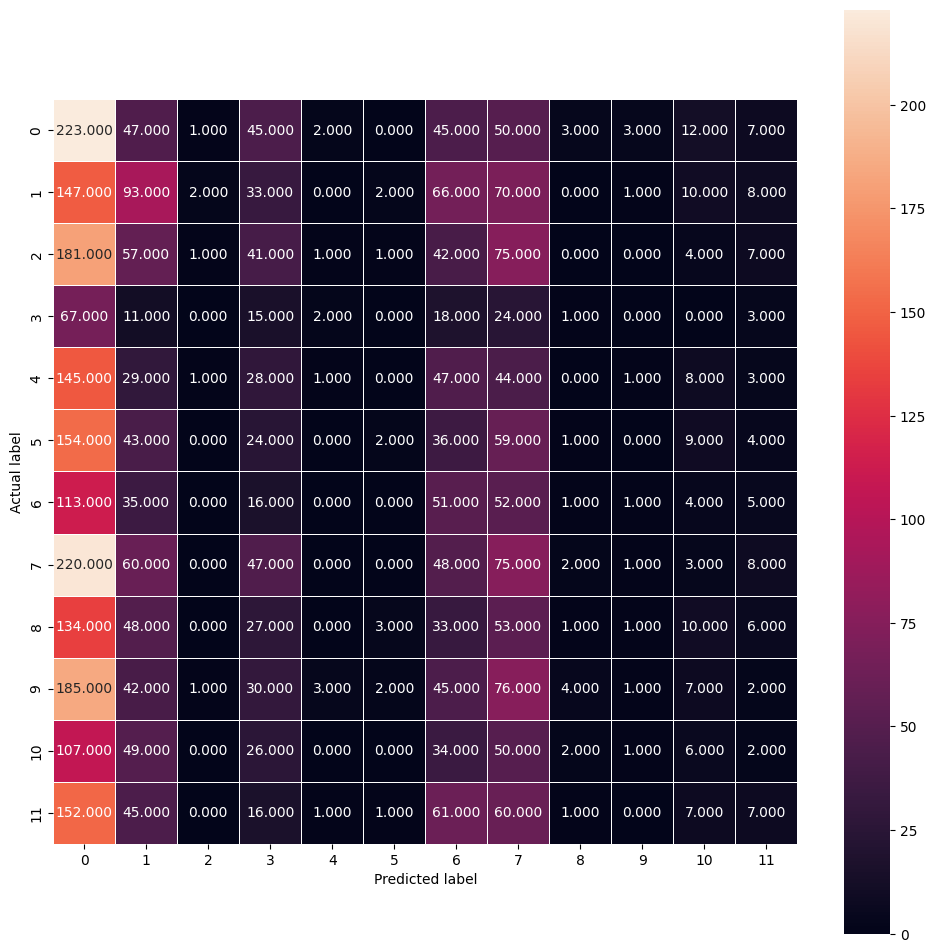

Multilabel confusion matrix for Gaussian Naive Bayes
Classification report for Gaussian Naive Bayes
              precision    recall  f1-score   support

           0       0.12      0.51      0.20       438
           1       0.17      0.22      0.19       432
           2       0.17      0.00      0.00       410
           3       0.04      0.11      0.06       141
           4       0.10      0.00      0.01       307
           5       0.18      0.01      0.01       332
           6       0.10      0.18      0.13       278
           7       0.11      0.16      0.13       464
           8       0.06      0.00      0.01       316
           9       0.10      0.00      0.00       398
          10       0.07      0.02      0.03       277
          11       0.11      0.02      0.03       351

    accuracy                           0.11      4144
   macro avg       0.11      0.10      0.07      4144
weighted avg       0.12      0.11      0.07      4144

Gaussian Naive Bayes classificati

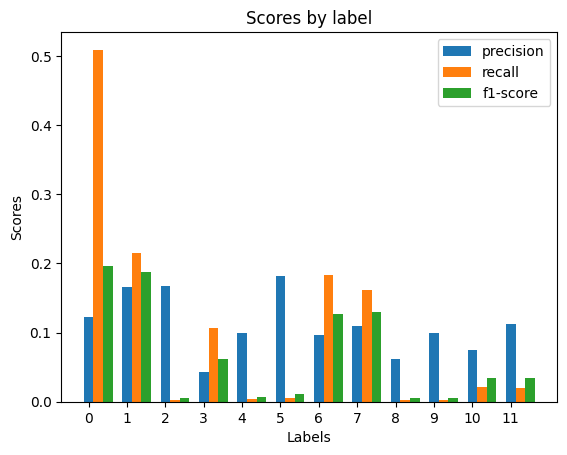

In [359]:
# use GNaiveBayes
gnb = GNaiveBayes()
gnb.fit(X_train_nb, Y_train_nb)
X_train_nb = np.array(X_train_nb)
X_test_nb = np.array(X_test_nb)
# training accuracy
y_gnb_pred_tr = np.zeros(X_train_nb.shape[0],dtype=int)
for  i in range(X_train_nb.shape[0]):
    y_gnb_pred_tr[i] = gnb.predict(X_train_nb[i])
print(y_gnb_pred_tr, Y_train_nb)
print("Gaussian Naive Bayes classification Training accuracy", gnb.accuracy(Y_train_nb, y_gnb_pred_tr))

y_gnb_pred = np.zeros(X_test_nb.shape[0],dtype=int)
for  i in range(X_test_nb.shape[0]):
    y_gnb_pred[i] = gnb.predict(X_test_nb[i])
print(y_gnb_pred, Y_test_nb)
# print unique values in y_gnb_pred
print("unique pred values-->",np.unique(y_gnb_pred))
print("Gaussian Naive Bayes classification Testing accuracy", gnb.accuracy(Y_test_nb, y_gnb_pred))

# confusion matrix for all labels
print("Confusion matrix for Gaussian Naive Bayes")
# display confusion matrix for all labels
cm = confusion_matrix(Y_test_nb, y_gnb_pred)
# plot heatmap of confusion matrix
plt.figure(figsize=(12, 12))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


# use multiconfusion matrix
cm = multilabel_confusion_matrix(Y_test_nb, y_gnb_pred)
print("Multilabel confusion matrix for Gaussian Naive Bayes")
# print(cm)

# calculate precision, recall and f1 score for each label
print("Classification report for Gaussian Naive Bayes")
report = classification_report(Y_test_nb, y_gnb_pred)
print(report)

# plot bar graph for precision, recall and f1 score for each label
precision, recall, fscore, support = precision_recall_fscore_support(Y_test_nb, y_gnb_pred)
x = np.arange(len(precision))
plt.bar(x, precision, width=0.25, label='precision')
plt.bar(x+0.25, recall, width=0.25, label='recall')
plt.bar(x+0.5, fscore, width=0.25, label='f1-score')
plt.xticks(x, ('0', '1', '2', '3', '4', '5', '6', '7', '8', '9','10','11'))
plt.xlabel("Labels")
plt.ylabel("Scores")
plt.title("Scores by label")
plt.legend()

# test accuracy
print("Gaussian Naive Bayes classification Testing accuracy", gnb.accuracy(Y_test_nb, y_gnb_pred))
# training accuracy
print("Gaussian Naive Bayes classification Training accuracy", gnb.accuracy(Y_train_nb, y_gnb_pred_tr))
precision = precision_score(Y_test_nb, y_gnb_pred, average='micro')
recall = recall_score(Y_test_nb, y_gnb_pred, average='micro')
f1 = f1_score(Y_test_nb, y_gnb_pred, average='micro')

print(f'Gaussian Naive Bayes micro-averaged precision: {precision:.2f}, recall: {recall:.2f}, f1: {f1:.2f}')

In [210]:
# ---------------------------- SK LEARN IMPLEMENTATIONS ----------------------------

In [214]:
df.shape

(20716, 9)

In [222]:
df.head()

,Energy,Key,Loudness,Speechiness,Acousticness,Valence,Tempo,Views,Likes
0,0.704994,6,0.838905,0.183610,0.008392,0.777442,0.569330,0.085840,0.122486
1,0.702994,8,0.857222,0.031328,0.087248,0.858006,0.381149,0.008913,0.021247
2,0.922998,1,0.897183,0.054149,0.042670,0.554884,0.443823,0.001044,0.005555
3,0.738995,2,0.857328,0.026971,0.000014,0.582075,0.494810,0.026208,0.035216
4,0.693994,10,0.797609,0.177386,0.025401,0.528701,0.690108,0.076548,0.122022


In [226]:
X_train_r, y_train_r, X_test_r, y_test_r = get_down_sampled_data(df, frac=0.5)

In [227]:
X_train_r.shape

(8286, 8)

In [243]:
# ----------------------------- Logistic Regression sk learn implementation -----------------------------

In [360]:
logistic_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
logistic_reg.fit(X_train_r, y_train_r)
y_pred = logistic_reg.predict(X_test_r)
precision = precision_score(y_test_r, y_pred, average='micro')
recall = recall_score(y_test_r, y_pred, average='micro')
f1 = f1_score(y_test_r, y_pred, average='micro')
# test accuracy
print("Logistic Regression classification Testing accuracy", logistic_reg.score(X_test_r, y_test_r))
# training accuracy
print("Logistic Regression classification Training accuracy", logistic_reg.score(X_train_r, y_train_r))

print(f'LogisticRegression: precision={precision}, recall={recall}, f1={f1}')

Logistic Regression classification Testing accuracy 0.11583011583011583
Logistic Regression classification Training accuracy 0.13951243060584118
LogisticRegression: precision=0.11583011583011583, recall=0.11583011583011583, f1=0.11583011583011583


In [233]:
# ----------------------------  SVM Sk-learn implementation ----------------------------

In [230]:
svm_stats = {}

C = [0.001, 0.01, 0.1, 1, 10]
kernels = ['linear', 'poly', 'rbf', 'sigmoid']

for c in C:
    for k in kernels:
        st = time.time()
        svm_trained = svm.SVC(kernel=k, C=c, random_state=0).fit(X_train_r, y_train_r)
        y_pred = svm_trained.predict(X_test_r)
        training_score = svm_trained.score(X_train_r, y_train_r)
        weighted_test_score = balanced_accuracy_score(y_true=y_test_r, y_pred=y_pred, adjusted=True)
        test_score = svm_trained.score(X_test_r, y_test_r)
        precision = precision_score(y_test_r, y_pred, average='micro')
        recall = recall_score(y_test_r, y_pred, average='micro')
        f1 = f1_score(y_test_r, y_pred, average='micro')

        svm_stats[(c, k)] = {
            'training_score': training_score,
            'test_score': test_score,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

        print(c, k)

print(svm_stats)

0.001 linear
0.001 poly
0.001 rbf
0.001 sigmoid
0.01 linear
0.01 poly
0.01 rbf
0.01 sigmoid
0.1 linear
0.1 poly
0.1 rbf
0.1 sigmoid
1 linear
1 poly
1 rbf
1 sigmoid
10 linear
10 poly
10 rbf
10 sigmoid
{(0.001, 'linear'): {'training_score': 0.11030654115375332, 'test_score': 0.0916988416988417, 'precision': 0.0916988416988417, 'recall': 0.0916988416988417, 'f1': 0.0916988416988417}, (0.001, 'poly'): {'training_score': 0.11223750905141203, 'test_score': 0.09266409266409266, 'precision': 0.09266409266409266, 'recall': 0.09266409266409266, 'f1': 0.09266409266409266}, (0.001, 'rbf'): {'training_score': 0.11030654115375332, 'test_score': 0.0916988416988417, 'precision': 0.0916988416988417, 'recall': 0.0916988416988417, 'f1': 0.0916988416988417}, (0.001, 'sigmoid'): {'training_score': 0.11030654115375332, 'test_score': 0.0916988416988417, 'precision': 0.0916988416988417, 'recall': 0.0916988416988417, 'f1': 0.0916988416988417}, (0.01, 'linear'): {'training_score': 0.11030654115375332, 'test_sco

In [361]:
svm_trained = svm.SVC(kernel='rbf', C=1, random_state=0).fit(X_train_r, y_train_r)
y_pred = svm_trained.predict(X_test_r)
precision = precision_score(y_test_r, y_pred, average='micro')
recall = recall_score(y_test_r, y_pred, average='micro')
f1 = f1_score(y_test_r, y_pred, average='micro')
# test accuracy
print("SVM classification Testing accuracy", svm_trained.score(X_test_r, y_test_r))
# training accuracy
print("SVM classification Training accuracy", svm_trained.score(X_train_r, y_train_r))

print(f'SVM precision: {precision} recall: {recall} f1: {f1}')

SVM classification Testing accuracy 0.12065637065637065
SVM classification Training accuracy 0.14083997103548154
SVM precision: 0.12065637065637065 recall: 0.12065637065637065 f1: 0.12065637065637065


In [234]:
# ------------------------- Decision Trees SK learn implementation -----------------------

Best Test Accuracy: 0.14422081781787033
Best Test Accuracy Depth: 20
Best F1 Micro: 0.14422081781787033
Best F1 Micro Depth: 20


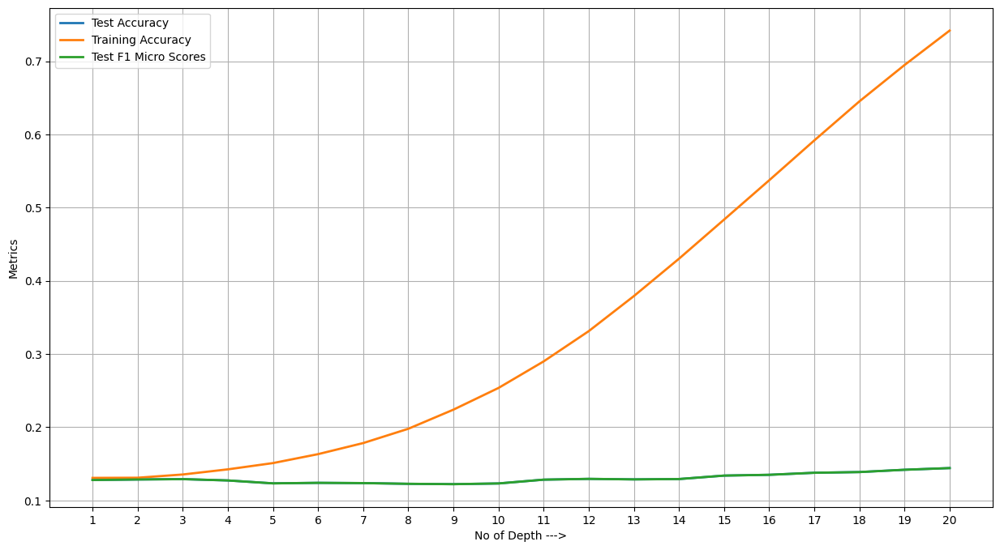

In [232]:

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_validate


#Dataset
X_train_dt = X_train
Y_train_dt = y_train
X_test_dt = X_test
Y_test_dt = y_test
training_accuracies= []
testing_accuracies =[]
testing_f1_micro_scores = []

best_test_accuracy = 0
best_f1_micro = 0

best_test_accuracy_depth = 0
best_f1_micro_depth = 0

max_depth = 20

# Create a decision tree classifier with variable depth

for d in range(1, max_depth+1):
    clf = DecisionTreeClassifier(max_depth=d)
    scores = cross_validate(clf, X_train_r, y_train_r, cv=10, scoring=('accuracy', 'f1_micro'), return_train_score=True)
    training_accuracies.append(scores['train_accuracy'].mean())
    testing_accuracies.append(scores['test_accuracy'].mean())
    testing_f1_micro_scores.append(scores['test_f1_micro'].mean())
    
    if scores['test_accuracy'].mean() > best_test_accuracy:
        best_test_accuracy_depth = d
        best_test_accuracy = scores['test_accuracy'].mean()
        
    if scores['test_f1_micro'].mean() > best_f1_micro:
        best_f1_micro_depth = d
        best_f1_micro = scores['test_f1_micro'].mean()

print("Best Test Accuracy:", best_test_accuracy)
print("Best Test Accuracy Depth:", best_test_accuracy_depth)
print("Best F1 Micro:", best_f1_micro)
print("Best F1 Micro Depth:", best_f1_micro_depth)

# print("Training Accuracies:", training_accuracies)
# print("Testing Accuracies:", testing_accuracies)
# print("Testing F1 Micro Scores:", testing_f1_micro_scores)


x=list(range(1, max_depth+1))
plt.figure(figsize=(15,8))
plt.plot(testing_accuracies, label = "Test Accuracy", linestyle="-",linewidth=2)
plt.plot(training_accuracies, label = "Training Accuracy", linestyle="-",linewidth=2)
plt.plot(testing_f1_micro_scores, label = "Test F1 Micro Scores", linestyle="-",linewidth=2)
plt.xlabel('No of Depth --->')
plt.ylabel('Metrics')
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x)
plt.grid()
plt.legend()
plt.show()

In [362]:
clf = DecisionTreeClassifier(max_depth=best_test_accuracy_depth)
clf.fit(X_train_r, y_train_r)
y_pred = clf.predict(X_test_r)
precision = precision_score(y_test_r, y_pred, average='micro')
recall = recall_score(y_test_r, y_pred, average='micro')
f1 = f1_score(y_test_r, y_pred, average='micro')
# test accuracy
print("DT classification Testing accuracy", clf.score(X_test_r, y_test_r))
# training accuracy
print("DT classification Training accuracy", clf.score(X_train_r, y_train_r))

print(f'DT precision: {precision} recall: {recall} f1: {f1}')

DT classification Testing accuracy 0.1365830115830116
DT classification Training accuracy 0.687303886072894
DT precision: 0.1365830115830116 recall: 0.1365830115830116 f1: 0.1365830115830116


In [133]:
# ------------------------------------------------- KNN -------------------------------------------------

Best test accuracy: 0.1637700098483127 at k: 1
Best f1 micro: 0.16377000984831266 at k: 1
Training accuracies: [1.0, 0.583460764573777, 0.45380432689387523, 0.4045914499049939, 0.3787781582674069, 0.3541984574976086, 0.33517040561469924, 0.3141576971220319, 0.29545143294604803, 0.2847774455730869]
Testing accuracies: [0.1637700098483127, 0.13553259558399328, 0.1302213539390337, 0.1280486063763454, 0.12575464881150097, 0.12478759112602926, 0.12188816629079913, 0.12092285682651235, 0.11814813843580825, 0.11706351287564905]
Testing f1 micro scores: [0.16377000984831266, 0.13553259558399328, 0.1302213539390337, 0.1280486063763454, 0.12575464881150097, 0.12478759112602926, 0.12188816629079913, 0.12092285682651235, 0.11814813843580825, 0.11706351287564905]


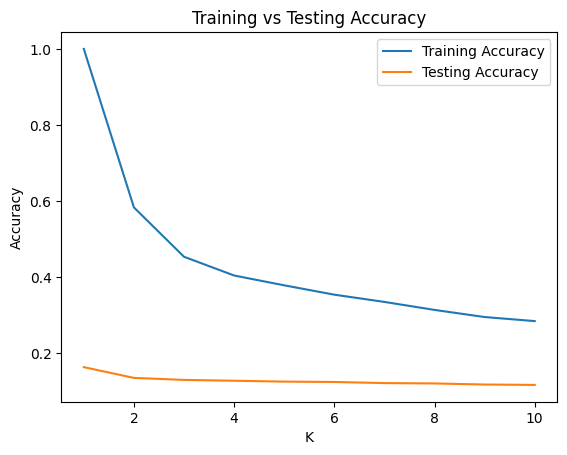

In [235]:
# k-nn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_validate

X_train_knn = X_train_r
y_train_knn = y_train_r
X_test_knn = X_test_r
y_test_knn = y_test_r


training_accuracies= []
testing_accuracies =[]
testing_f1_micro_scores = []


best_test_accuracy = 0
best_f1_micro = 0

best_test_accuracy_frac = 0
best_f1_micro_frac = 0
# since it is a complex boundary, we will use k = 1
best_k = None
best_score = 0

total = 10

for k in range(1, total+1):
    knn_clf = KNeighborsClassifier(n_neighbors=k)
    scores = cross_validate(knn_clf, X_train_knn, y_train_knn, cv=10, scoring=('accuracy', 'f1_micro'), return_train_score=True)
    training_accuracies.append(scores['train_accuracy'].mean())
    testing_accuracies.append(scores['test_accuracy'].mean())
    testing_f1_micro_scores.append(scores['test_f1_micro'].mean())

    if scores['test_accuracy'].mean() > best_test_accuracy:
        best_test_accuracy = scores['test_accuracy'].mean()
        best_test_accuracy_k = k
    if scores['test_f1_micro'].mean() > best_f1_micro:
        best_f1_micro = scores['test_f1_micro'].mean()
        best_f1_micro_k = k

print("Best test accuracy:", best_test_accuracy, "at k:", best_test_accuracy_k)
print("Best f1 micro:", best_f1_micro, "at k:", best_f1_micro_k)

# knn is overfitting to the training data
print("Training accuracies:", training_accuracies)
print("Testing accuracies:", testing_accuracies)
print("Testing f1 micro scores:", testing_f1_micro_scores)



# plot training vs testing accuracy
plt.plot(range(1, total+1), training_accuracies, label="Training Accuracy")
plt.plot(range(1, total+1), testing_accuracies, label="Testing Accuracy")
plt.xlabel('K')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy')
plt.legend()
plt.show()


In [363]:
knn_clf = KNeighborsClassifier(n_neighbors=2)
knn_clf.fit(X_train_knn, y_train_knn)
y_pred = knn_clf.predict(X_test_knn)
precision = precision_score(y_test_knn, y_pred, average='micro')
recall = recall_score(y_test_knn, y_pred, average='micro')
f1 = f1_score(y_test_knn, y_pred, average='micro')
# test accuracy
print("KNN classification Testing accuracy", knn_clf.score(X_test_knn, y_test_knn))
# training accuracy
print("KNN classification Training accuracy", knn_clf.score(X_train_knn, y_train_knn))

print(f'KNN precision: {precision} recall: {recall} f1: {f1}')

KNN classification Testing accuracy 0.14333976833976833
KNN classification Training accuracy 0.5870142408882453
KNN precision: 0.14333976833976833 recall: 0.14333976833976833 f1: 0.14333976833976833


In [236]:
# ------------------------------------------------- Neural Networks -------------------------------------------------

done for nodes: 1
done for nodes: 2
done for nodes: 3
done for nodes: 4
done for nodes: 5
done for nodes: 6
done for nodes: 7
done for nodes: 8
done for nodes: 9
done for nodes: 10
done for nodes: 11
done for nodes: 12
Best test accuracy: 0.13118476949703675 at nodes: 12
Best f1 micro: 0.13118476949703675 at nodes: 12
Training accuracies: [0.11030654234901358, 0.12818144309847185, 0.1321506304510929, 0.13915041032787498, 0.13271382726595563, 0.12179848113181527, 0.13320995500690058, 0.13443020578194392, 0.13767537618827788, 0.136642798347605, 0.14053161069743458, 0.14368278550486632]
Testing accuracies: [0.11030663799583924, 0.12515355209407758, 0.12660064217991523, 0.1294961335174793, 0.1246679836599593, 0.11658450027097429, 0.1241862030384084, 0.1290121676194472, 0.13082376182234573, 0.1301002896219763, 0.12768614185066693, 0.13118476949703675]
Testing f1 micro scores: [0.11030663799583924, 0.12515355209407758, 0.12660064217991523, 0.1294961335174793, 0.1246679836599593, 0.1165845002

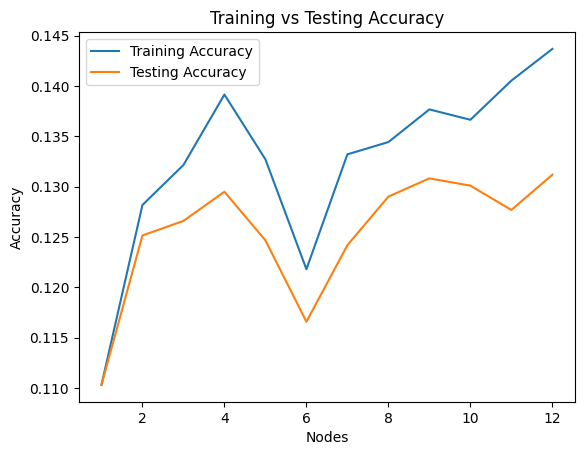

In [237]:


# Neural network scikit learn
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_validate

X_train_nn = X_train_r
y_train_nn = y_train_r
X_test_nn = X_test_r
y_test_nn = y_test_r

training_accuracies= []
testing_accuracies =[]
testing_f1_micro_scores = []

best_test_accuracy = 0
best_f1_micro = 0

best_test_accuracy_frac = 0
best_f1_micro_frac = 0

# best neural network parameters 
best_hidden_layer_sizes = (6,6)
best_max_iter = 1000

total = 10

for nodes in range(1,13):
    nn_clf = MLPClassifier(hidden_layer_sizes=(nodes, 12), max_iter=1000, random_state=1)
    scores = cross_validate(nn_clf, X_train_nn, y_train_nn, cv=10, scoring=('accuracy', 'f1_micro'), return_train_score=True)
    training_accuracies.append(scores['train_accuracy'].mean())
    testing_accuracies.append(scores['test_accuracy'].mean())
    testing_f1_micro_scores.append(scores['test_f1_micro'].mean())

    if scores['test_accuracy'].mean() > best_test_accuracy:
        best_test_accuracy = scores['test_accuracy'].mean()
        best_test_accuracy_nodes = nodes
    if scores['test_f1_micro'].mean() > best_f1_micro:
        best_f1_micro = scores['test_f1_micro'].mean()
        best_f1_micro_nodes = nodes
    print('done for nodes:', nodes)

print("Best test accuracy:", best_test_accuracy, "at nodes:", best_test_accuracy_nodes)
print("Best f1 micro:", best_f1_micro, "at nodes:", best_f1_micro_nodes)

print("Training accuracies:", training_accuracies)
print("Testing accuracies:", testing_accuracies)
print("Testing f1 micro scores:", testing_f1_micro_scores)

# plot training vs testing accuracy
plt.plot(range(1, 13), training_accuracies, label="Training Accuracy")
plt.plot(range(1, 13), testing_accuracies, label="Testing Accuracy")
plt.xlabel('Nodes')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy')
plt.legend()
plt.show()


In [364]:
nn_clf = MLPClassifier(hidden_layer_sizes=(12, 12), max_iter=1000, random_state=1)
nn_clf.fit(X_train_nn, y_train_nn)
y_pred = nn_clf.predict(X_test_nn)
precision = precision_score(y_test_nn, y_pred, average='micro')
recall = recall_score(y_test_nn, y_pred, average='micro')
f1 = f1_score(y_test_nn, y_pred, average='micro')
# test accuracy
print("Neural Network classification Testing accuracy", nn_clf.score(X_test_nn, y_test_nn))
# training accuracy
print("Neural Network classification Training accuracy", nn_clf.score(X_train_nn, y_train_nn))

print(f'Neural Network precision: {precision} recall: {recall} f1: {f1}')

Neural Network classification Testing accuracy 0.12162162162162163
Neural Network classification Training accuracy 0.14554670528602462
Neural Network precision: 0.12162162162162163 recall: 0.12162162162162163 f1: 0.12162162162162163


In [238]:
# Let us drop the 'key' column and see if it is possible to predict each and every other column 
# with the remaining columns.

# As the values of the columns are continuous, we will use regression to predict the values 
# and use a regression metric to evaluate the performance of the model.

In [239]:
df.drop(labels=['Key'], axis=1, inplace=True)
df.head()

,Energy,Loudness,Speechiness,Acousticness,Valence,Tempo,Views,Likes
0,0.704994,0.838905,0.183610,0.008392,0.777442,0.569330,0.085840,0.122486
1,0.702994,0.857222,0.031328,0.087248,0.858006,0.381149,0.008913,0.021247
2,0.922998,0.897183,0.054149,0.042670,0.554884,0.443823,0.001044,0.005555
3,0.738995,0.857328,0.026971,0.000014,0.582075,0.494810,0.026208,0.035216
4,0.693994,0.797609,0.177386,0.025401,0.528701,0.690108,0.076548,0.122022


In [241]:
df.shape

(20716, 8)

In [242]:
def get_split_data_wrt_label(df, y_label):
    df_resampled = df.sample(frac=frac, axis='index', random_state=1, replace=False)
    X_resampled = df_resampled.drop(y_label, axis=1).values
    y_resampled = df_resampled[y_label].values
    X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X_resampled, y_resampled, random_state=1, test_size=0.2)
    return X_train_r, y_train_r, X_test_r, y_test_r

def get_r2_score(y_test, y_pred):
    return r2_score(y_test, y_pred)

def decision_tree_r2(X_train, y_train, X_test, y_test):
    clf = DecisionTreeRegressor()
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    return get_r2_score(y_test, y_pred)

def svm_r2(X_train, y_train, X_test, y_test):
    svc = svm.SVR(kernel='linear')
    svc.fit(X_train, y_train)
    y_pred = svc.predict(X_test)
    return get_r2_score(y_test, y_pred)

def ada_boost_r2(X_train, y_train, X_test, y_test):
    clf = AdaBoostRegressor(n_estimators=100)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    return get_r2_score(y_test, y_pred)

def knn_r2(X_train, y_train, X_test, y_test):
    knn = KNeighborsRegressor(n_neighbors=5)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    return get_r2_score(y_test, y_pred)

def nn_r2(X_train, y_train, X_test, y_test):
    nn = MLPRegressor()
    nn.fit(X_train, y_train)
    y_pred = nn.predict(X_test)
    return get_r2_score(y_test, y_pred)


# r2 squared values wrt label removals
alr = {}

for label_column in df.columns:
    X_train_l, y_train_l, X_test_l, y_test_l = get_split_data_wrt_label(df, label_column)
    alr[('dt', label_column)] = decision_tree_r2(X_train_l, y_train_l, X_test_l, y_test_l)
    alr[('svm', label_column)] = svm_r2(X_train_l, y_train_l, X_test_l, y_test_l)
    alr[('ada_dt', label_column)] = ada_boost_r2(X_train_l, y_train_l, X_test_l, y_test_l)
    alr[('knn', label_column)] = knn_r2(X_train_l, y_train_l, X_test_l, y_test_l)
    alr[('nn'), label_column] = nn_r2(X_train_l, y_train_l, X_test_l, y_test_l)
    print('done with column:', label_column)
    # break

alr


done with column: Energy
done with column: Loudness
done with column: Speechiness
done with column: Acousticness
done with column: Valence
done with column: Tempo
done with column: Views
done with column: Likes


{('dt', 'Energy'): 0.5109190187748169,
 ('svm', 'Energy'): 0.7226458437817702,
 ('ada_dt', 'Energy'): 0.6726592648273058,
 ('knn', 'Energy'): 0.7049468372022767,
 ('nn', 'Energy'): 0.7181533117485085,
 ('dt', 'Loudness'): 0.5355960609044415,
 ('svm', 'Loudness'): 0.586261767244252,
 ('ada_dt', 'Loudness'): 0.6168272955546932,
 ('knn', 'Loudness'): 0.7062648056160852,
 ('nn', 'Loudness'): 0.7026218668898353,
 ('dt', 'Speechiness'): -0.7692660341648776,
 ('svm', 'Speechiness'): -0.1259151000992753,
 ('ada_dt', 'Speechiness'): -0.2777524979379373,
 ('knn', 'Speechiness'): -0.07854736615516367,
 ('nn', 'Speechiness'): 0.0408216331662109,
 ('dt', 'Acousticness'): 0.052324656786573276,
 ('svm', 'Acousticness'): 0.4828563171695103,
 ('ada_dt', 'Acousticness'): 0.3958957314097217,
 ('knn', 'Acousticness'): 0.40810361958569474,
 ('nn', 'Acousticness'): 0.5113078498592281,
 ('dt', 'Valence'): -0.38138089643532114,
 ('svm', 'Valence'): 0.18688409302098152,
 ('ada_dt', 'Valence'): 0.21971492314389